In [1]:
!pip install pyreadstat

In [2]:
import pandas as pd
import scipy.io
import pyreadstat
import numpy as np
import sklearn
import datetime
import os
import pylab as plt

In [3]:
Seasonal_files = ['Seasonal Agriculture Survey 2014 Season A Stata', 'Seasonal Agriculture Survey 2014 Season B Stata',
           'Seasonal Agriculture Survey 2014 Season C Stata', 'Seasonal Agriculture Survey 2015 Season A Stata',
            'Seasonal Agriculture Survey 2015 Season B Stata', 'Seasonal Agriculture Survey 2015 Season C Stata', 
           'Seasonal Agriculture Survey 2016 Season A Stata', 'Seasonal Agriculture Survey 2016 Season B Stata',
           'Seasonal Agriculture Survey 2016 Season C Stata', 'Seasonal Agriculture Survey 2017 Stata']

In [4]:
CFSVA_file = ['CFSVA 2006','CFSVA 2009', 'CFSVA 2012', 'CFSVA 2015']

In [5]:
def readFileInDictionary(path):
    os.chdir(path)
    output = {}
    for dirpath,dirmanes,filenames in os.walk('.'):
        for file in filenames:
            if file.endswith('.dta'):
                  output[str(file)] = pd.read_stata(str(file))
            elif file.endswith('.sav'):
                  output[str(file)] = pyreadstat.read_sav(str(file))
    os.chdir('../')
    return output

In [6]:
SeasonalOutputData = {}
CFSVAOutputData = {}

In [7]:
for i in Seasonal_files:
    SeasonalOutputData[str(i)] = readFileInDictionary(str(i))

In [8]:
for i in CFSVA_file:
     CFSVAOutputData[str(i)] = readFileInDictionary(str(i))

In [9]:
CFSVAOutputData['CFSVA 2012']['cfsvans-2012-children-mothers-household.sav'][0]

,Filename,FINAL_PopWeight,FINAL_norm_weight,hh_id_Corrupt,Rwanda,p_code,Dist_two,d_code,s_code,v_code,...,Q_mashland,road_km,logpc_exp_year,MONTHS_NEW2,logTotExp,Any_assistance,Sick_HF,logFIE,N_fews_code,N_C_Stunted
0,CFSVA2012_KIN-20120319042039-42940.xml,365.624968,1.258461,6547.0,1.0,4.0,403.0,403.0,40303.0,403030203.0,...,1.0,3.818377,5.716170,49.0000,5.116608,1.0,2.0,4.755875,3.0,0.0
1,CFSVA2012_KIN-20120419160719-99512.xml,341.027216,1.173797,6696.0,1.0,4.0,403.0,403.0,40307.0,403070405.0,...,1.0,1.389244,5.389875,359.4816,4.793092,1.0,0.0,4.748188,3.0,0.0
2,CFSVA2012_KIN-20120428131529-61442.xml,222.389813,0.765453,4161.0,1.0,3.0,302.0,302.0,30211.0,302110506.0,...,0.0,1.565248,4.638156,121.2201,4.347005,0.0,1.0,4.292256,4.0,0.0
3,CFSVA2012_KIN-20120425104908-42837.xml,258.514729,0.889793,3936.0,1.0,3.0,302.0,302.0,30202.0,302020605.0,...,0.0,2.184033,4.504335,595.8481,4.053591,0.0,0.0,3.769377,4.0,0.0
4,CFSVA2012_KIN-20120402114101-52181.xml,289.566610,0.996672,6918.0,1.0,4.0,404.0,404.0,40405.0,404050206.0,...,1.0,3.807886,4.550403,225.0000,4.324968,0.0,0.0,4.271842,3.0,0.0
5,CFSVA2012_KIN-20120403114657-73809.xml,330.770402,1.138493,3849.0,1.0,3.0,301.0,301.0,30112.0,301120307.0,...,0.0,6.341136,4.571709,107.1225,4.282169,1.0,2.0,4.019116,4.0,2.0
6,CFSVA2012_KIN-20120324102558-13912.xml,332.300219,1.143759,4463.0,1.0,3.0,303.0,303.0,30306.0,303060302.0,...,1.0,0.141421,4.429860,324.0000,4.144678,1.0,0.0,3.939519,3.0,1.0
7,CFSVA2012_KIN-20120404104533-6961.xml,281.521896,0.968983,4254.0,1.0,3.0,303.0,303.0,30310.0,303100502.0,...,0.0,3.087070,4.037426,167.4436,3.633468,1.0,1.0,3.544068,3.0,0.0
8,CFSVA2012_KIN-20120321112723-22348.xml,225.612854,0.776547,4103.0,1.0,3.0,302.0,302.0,30209.0,302090207.0,...,1.0,6.360031,3.976808,1194.3936,3.774274,1.0,0.0,3.726727,4.0,2.0
9,CFSVA2012_KIN-20120321112723-22348.xml,225.612854,0.776547,4103.0,1.0,3.0,302.0,302.0,30209.0,302090207.0,...,1.0,6.360031,3.976808,3136.0000,3.774274,1.0,0.0,3.726727,4.0,2.0


In [11]:
Population_weight = CFSVAOutputData['CFSVA 2012']['cfsvans-2012-children-mothers-household.sav'][0]['FINAL_PopWeight']
wealth_index = CFSVAOutputData['CFSVA 2012']['cfsvans-2012-children-mothers-household.sav'][0]['NFAC1_1']

In [13]:
dada = CFSVAOutputData['CFSVA 2012']['cfsvans-2012-children-mothers-household.sav'][0]['fdgrp1_consumed']

In [14]:
data = SeasonalOutputData['Seasonal Agriculture Survey 2014 Season A Stata']['Yield.dta']
data = data.set_index(['group_crop'])

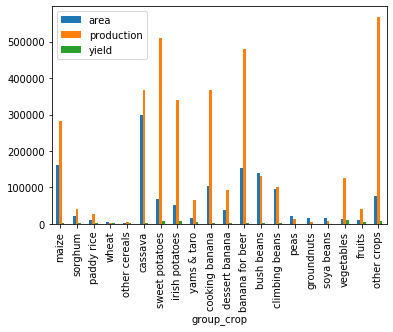

In [15]:
import matplotlib.pyplot as plt 
data.plot(kind='bar')
plt.xticks(rotation=90)
plt.title('Graph of Seasonal A Agriculture')
plt.show()

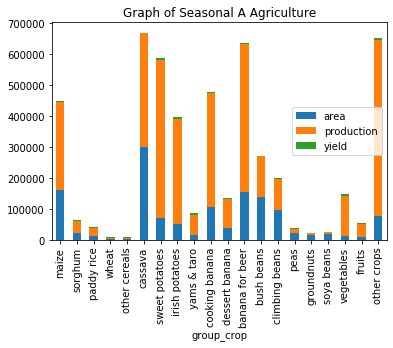

In [16]:
data.plot.bar(stacked=True);
plt.title('Graph of Seasonal A Agriculture 2014')
plt.xticks(rotation=90)
plt.show()

In [20]:
dataB = SeasonalOutputData['Seasonal Agriculture Survey 2014 Season B Stata']['Yield.dta']
dataB = dataB.set_index(['group_crop'])

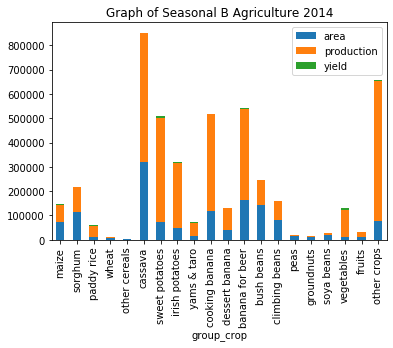

In [21]:
dataB.plot.bar(stacked=True);
plt.title('Graph of Seasonal B Agriculture 2014')
plt.xticks(rotation=90)
plt.show()

In [22]:
dataC = SeasonalOutputData['Seasonal Agriculture Survey 2014 Season C Stata']['Yield.dta']
dataC = dataC.set_index(['group_crop'])


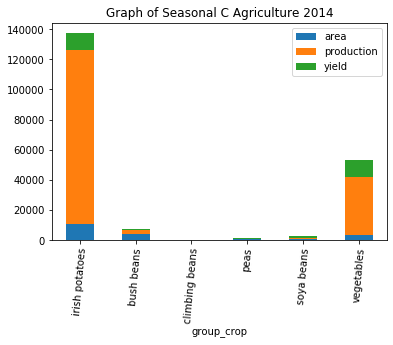

In [23]:
dataC.plot.bar(stacked=True);
plt.title('Graph of Seasonal C Agriculture 2014')
plt.xticks(rotation=85)
plt.show()

In [24]:
data1A = SeasonalOutputData['Seasonal Agriculture Survey 2015 Season A Stata']['Yield.dta']
data1A = data1A.set_index(['group_crop'])


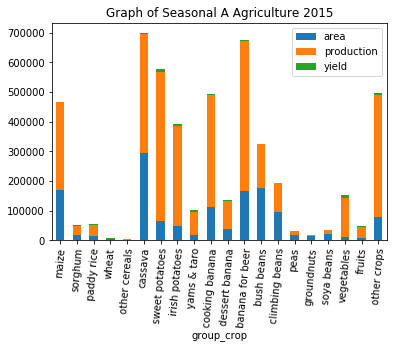

In [25]:
data1A.plot.bar(stacked=True);
plt.title('Graph of Seasonal A Agriculture 2015')
plt.xticks(rotation=85)
plt.show()

In [26]:
data1B = SeasonalOutputData['Seasonal Agriculture Survey 2015 Season B Stata']['Yield.dta']
data1B = data1B.set_index(['group_crop'])


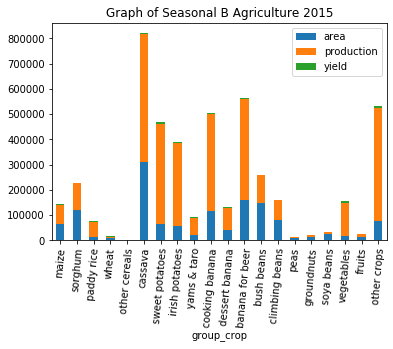

In [27]:
data1B.plot.bar(stacked=True);
plt.title('Graph of Seasonal B Agriculture 2015')
plt.xticks(rotation=85)
plt.show()

In [28]:
data1C = SeasonalOutputData['Seasonal Agriculture Survey 2015 Season C Stata']['Yield.dta']
data1C = data1C.set_index(['group_crop'])

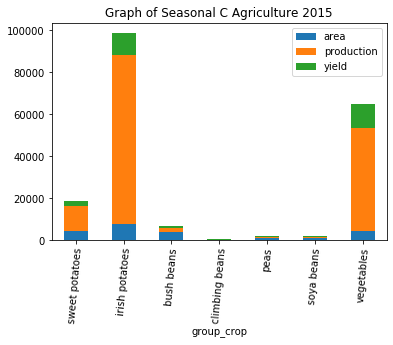

In [29]:
data1C.plot.bar(stacked=True);
plt.title('Graph of Seasonal C Agriculture 2015')
plt.xticks(rotation=85)
plt.show()

In [31]:
data2A = SeasonalOutputData['Seasonal Agriculture Survey 2016 Season A Stata']['Yield.dta']
data2A = data2A.set_index(['group_crop'])

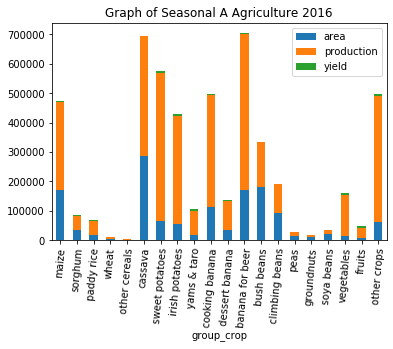

In [32]:
data2A.plot.bar(stacked=True);
plt.title('Graph of Seasonal A Agriculture 2016')
plt.xticks(rotation=85)
plt.show()

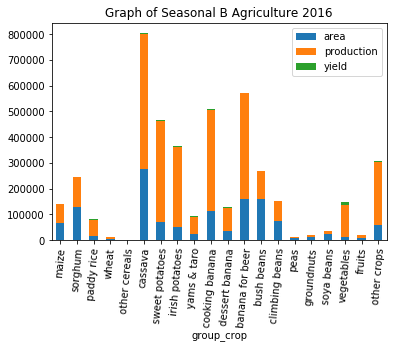

In [33]:
data2B = SeasonalOutputData['Seasonal Agriculture Survey 2016 Season B Stata']['Yield.dta']
data2B = data2B.set_index(['group_crop'])
data2B.plot.bar(stacked=True);
plt.title('Graph of Seasonal B Agriculture 2016')
plt.xticks(rotation=85)
plt.show()

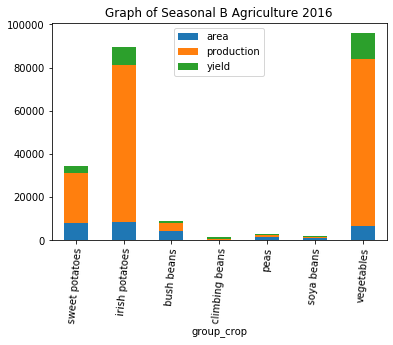

In [34]:
data2C = SeasonalOutputData['Seasonal Agriculture Survey 2016 Season C Stata']['Yield.dta']
data2C = data2C.set_index(['group_crop'])
data2C.plot.bar(stacked=True);
plt.title('Graph of Seasonal B Agriculture 2016')
plt.xticks(rotation=85)
plt.show()

In [35]:
data111 = SeasonalOutputData['Seasonal Agriculture Survey 2015 Season A Stata']['farmq_part0.dta']

In [38]:
esoko = pd.read_csv('esoko.csv')
Dates_data = esoko['Date'].unique().tolist()

In [39]:
def displayCommodityAvargePricePerDistrict(commodityName):
    df = pd.read_csv('esoko.csv')
    df = df.iloc[::-1]
    df = df.drop(['Province', 'Market'], axis=1)
    df = df.loc[df['Commodity']== commodityName]
    df = df.set_index(['Date'])
    df.groupby('District')['Average Price'].mean().sort_values().plot(kind='barh', figsize=(15,7), stacked = True)
    plt.title("Average price for {} per district ".format(commodityName))
    plt.xlabel("Average price (RWF) ")
    plt.ylabel("Districts ")
    plt.show()  

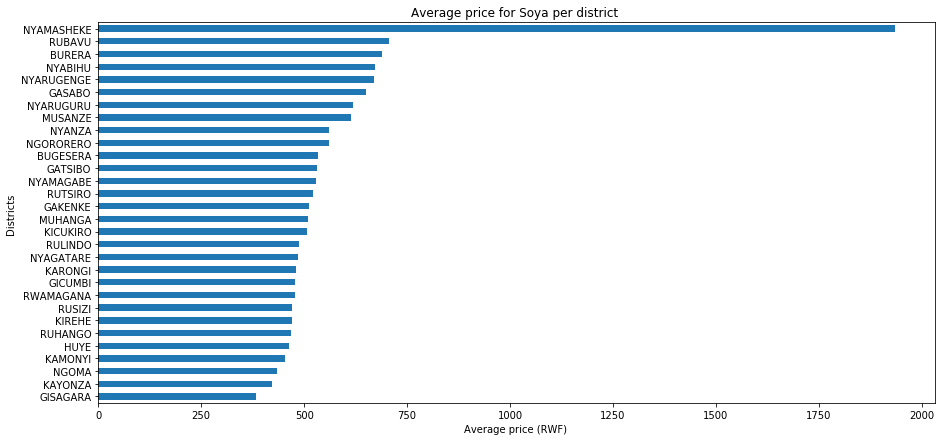

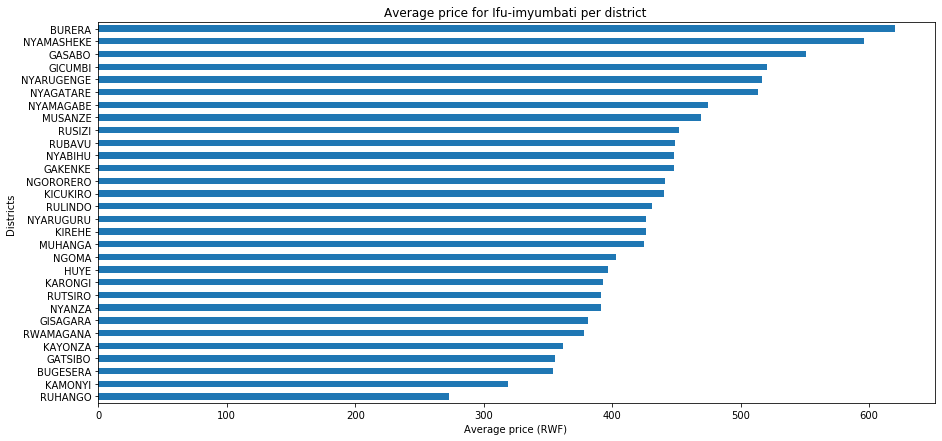

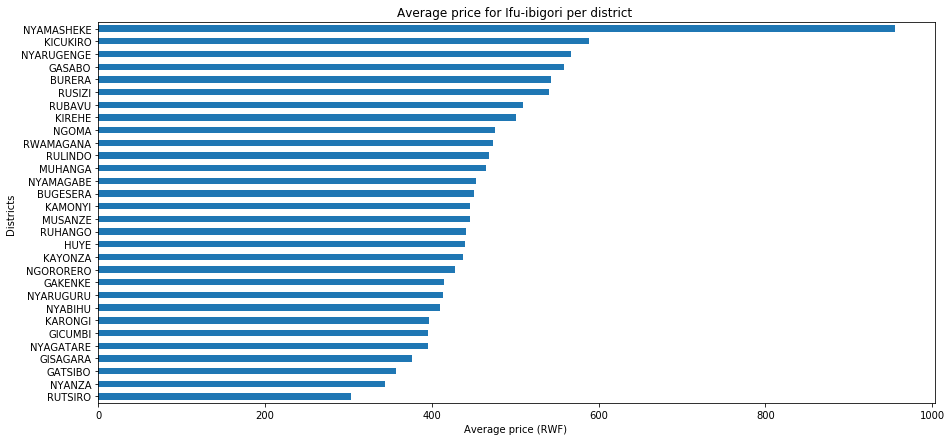

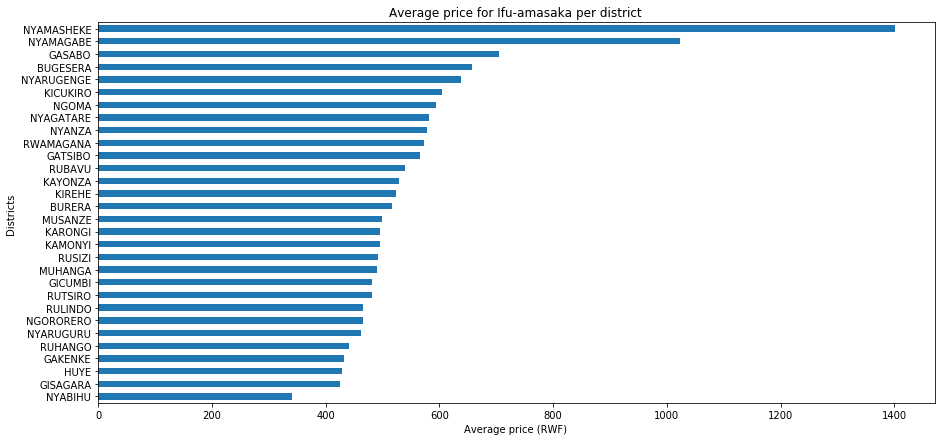

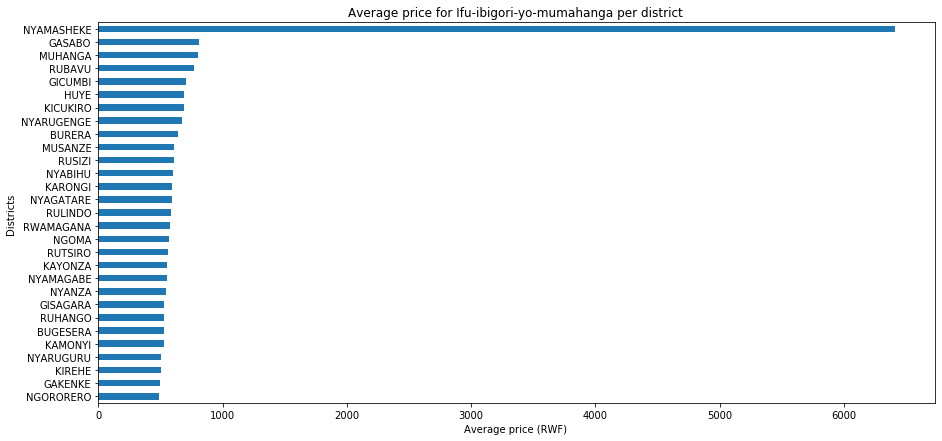

...

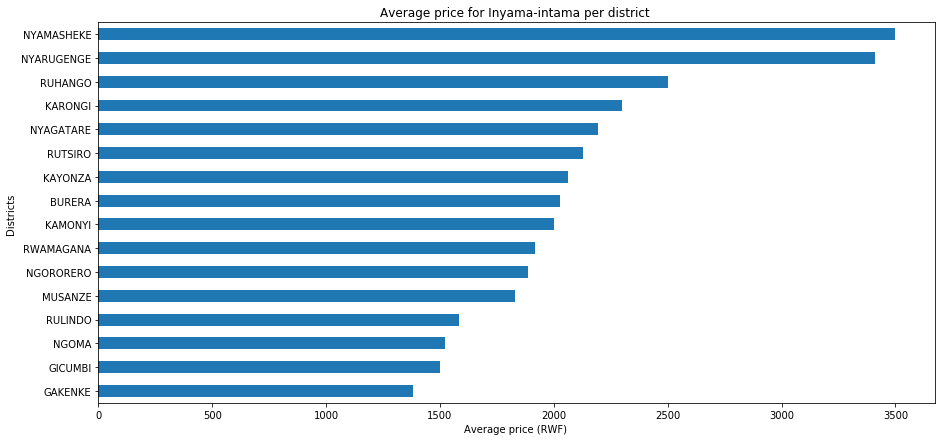

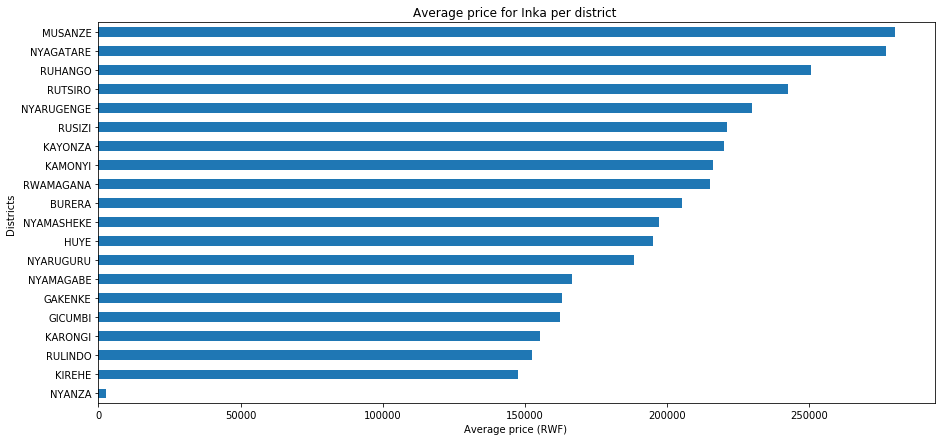

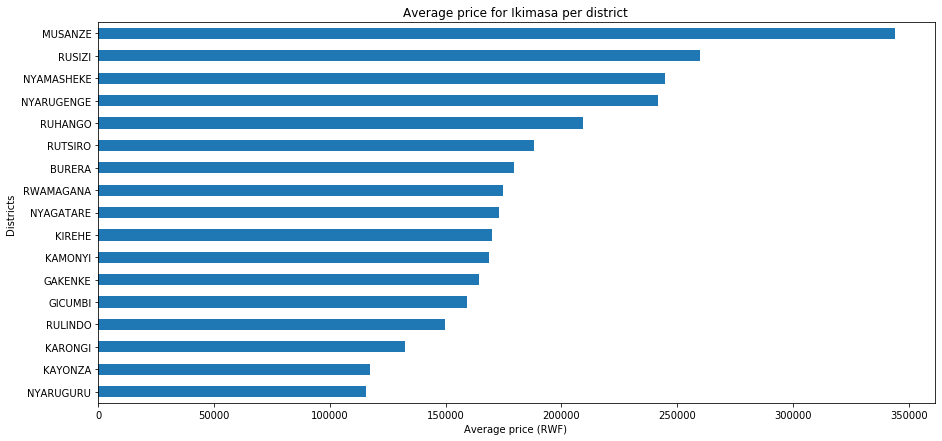

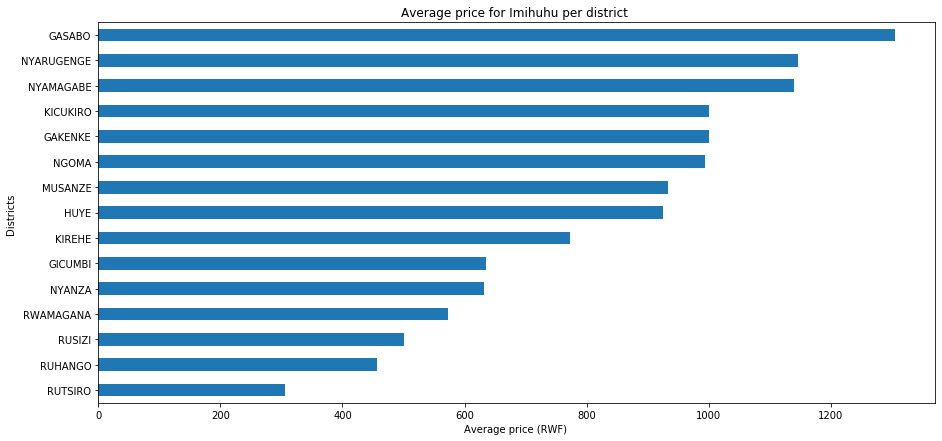

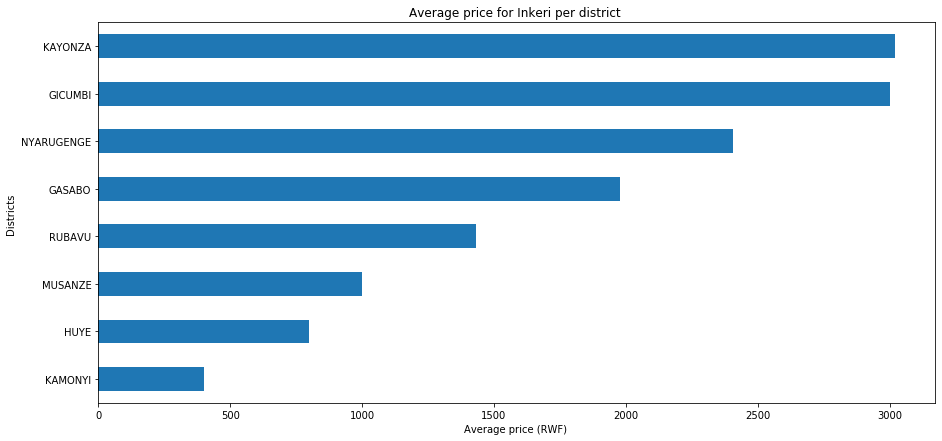

TypeError: Empty 'DataFrame': no numeric data to plot

In [40]:
commodity_data = esoko['Commodity'].unique().tolist()
commodity_data

for commodity in commodity_data:
    displayCommodityAvargePricePerDistrict(str(commodity))

In [54]:
commodity_data

['Soya',
 'Ifu-imyumbati',
 'Ifu-ibigori',
 'Ifu-amasaka',
 'Ifu-ibigori-yo-mumahanga',
 'Umuceli-Asia',
 'Umuceli-Tz',
 'Inyama-zinka',
 'Intama',
 'Ihene',
 'Amakara',
 'Ibigori',
 'Ibishyimbo',
 'Igitoki',
 'Ibirayi',
 'Inanasi',
 'Imineke',
 'Ibinyomoro',
 'Amatunda',
 'Indimu',
 'Mandarine',
 'Amacunga',
 'Imyembe',
 'Epinari',
 'Sereli',
 'Urusenda',
 'Beterave',
 'Inyanya',
 'Ibihaza',
 'Imyumbati',
 'Ibijumba',
 'Urunyogwe',
 'Puwaro',
 'Puwavuro',
 'Imiteja',
 'Karoti',
 'Dodo',
 'Tungurusumu',
 'ibitunguru-bitukura',
 'Ibitunguru-umweru',
 'Amasaka',
 'Amashaza',
 'Amashu',
 'inshyushyu',
 'Ingano',
 'Ubunyobwa',
 'Umuceli-RW',
 'Ifu-ingano',
 'Ipapayi',
 'Avoka',
 'Amapera',
 'Igi',
 'Inyama-ihene',
 'Uruhu-inka',
 'Uruhu-ihene',
 'Inkoko',
 'Isombe',
 'Ibiringanya',
 'Ibitoki-inkashi',
 'Konkombure',
 'Shufureri',
 'Ibitonore',
 'Perisili',
 'Pome',
 'Ubuki',
 'Inyama-ingurube',
 'Leti',
 'Ingurube',
 'Ditane',
 'Uree',
 'NPK',
 'Uruhu-intama',
 'DAP',
 'Inyama-intama',
 'I

In [60]:
def displayCommoditiesAveragePricesPereachDistrict(districtName):
    df = pd.read_csv('esoko.csv')
    df = df.iloc[::-1]
    df = df.drop(['Province', 'Market'], axis=1)#Droping the Province and Market columns
    df = df.loc[df['District']== districtName.upper() ]#Selected only one district
    df = df.set_index(['Date'])
    print('This for district {} '.format(districtName))
    df.groupby('Commodity')['Average Price'].mean().sort_values().plot(kind='barh', figsize=(50,47), stacked = True)
    plt.title("Commodities for {} district ".format(districtName))
    plt.xlabel("Average price (RWF) ")
    plt.ylabel("Commodities ")
    plt.show()

This for district GICUMBI 


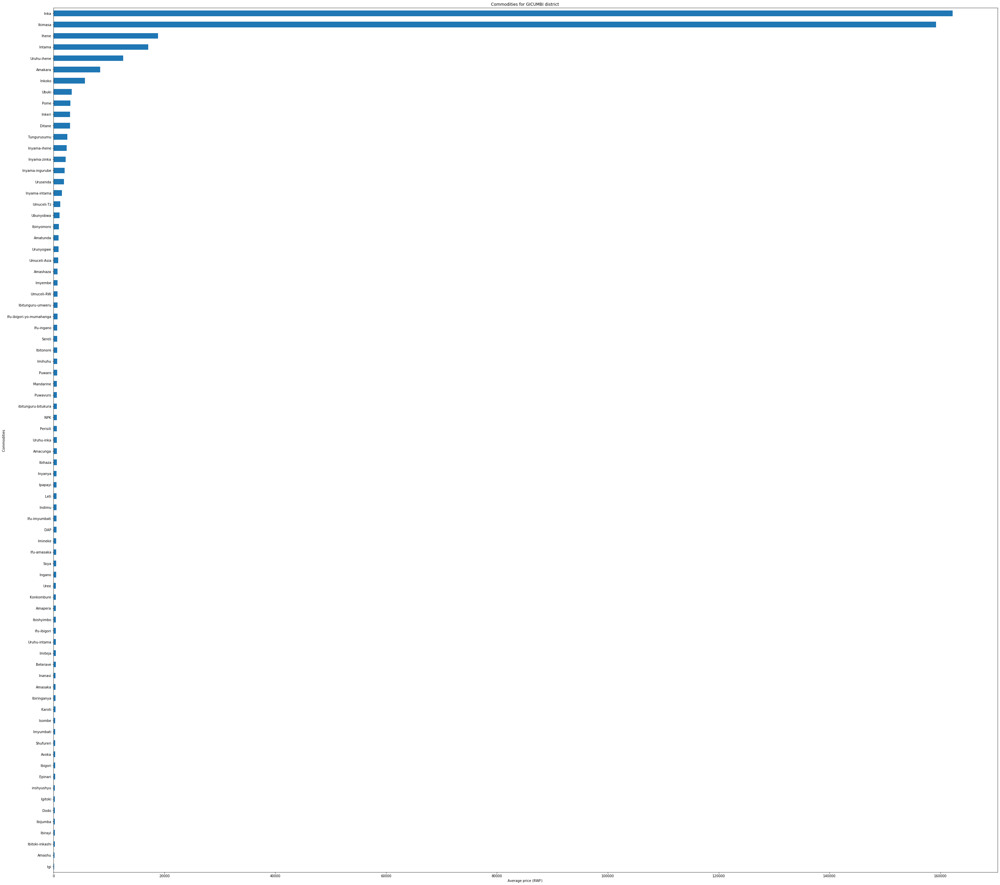

This for district GATSIBO 


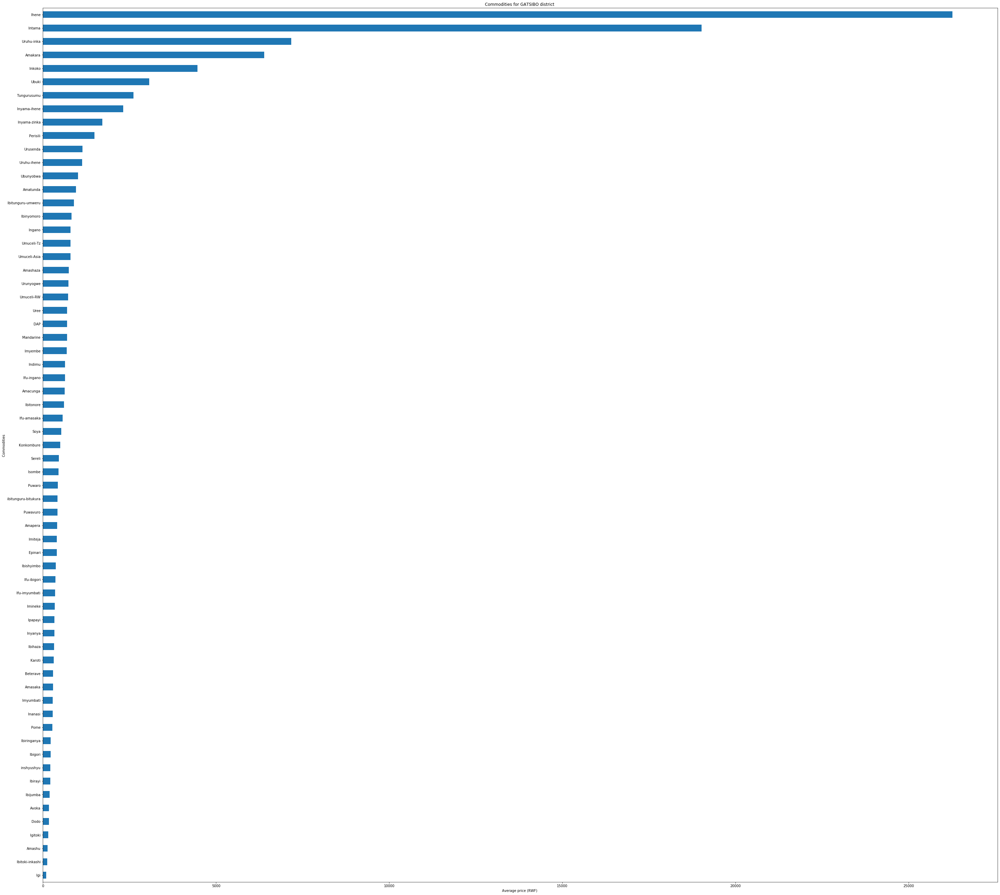

This for district KICUKIRO 


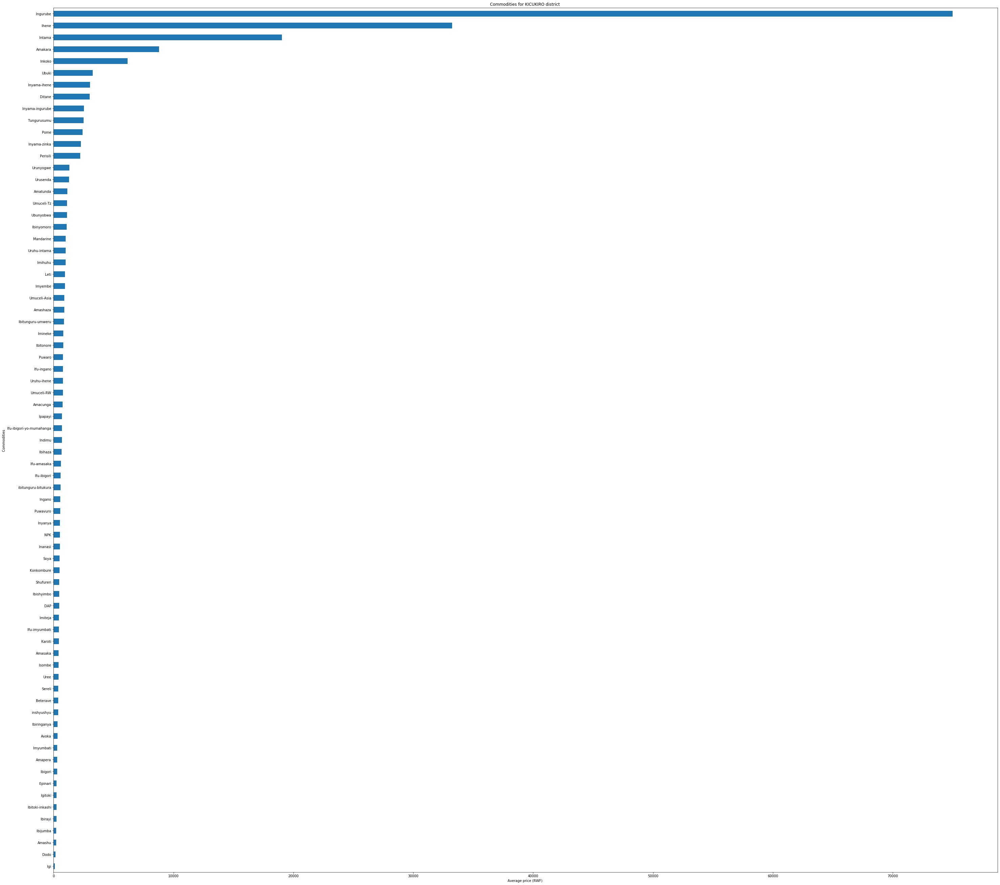

This for district NYAGATARE 


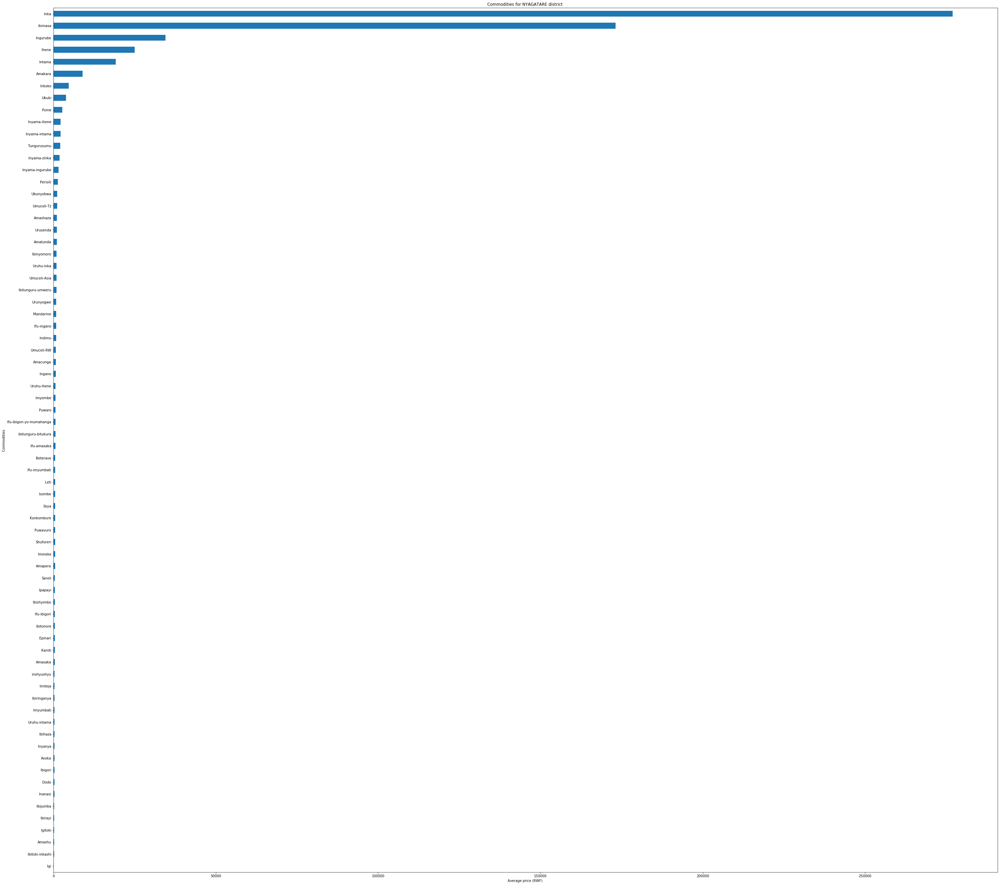

This for district NGOMA 


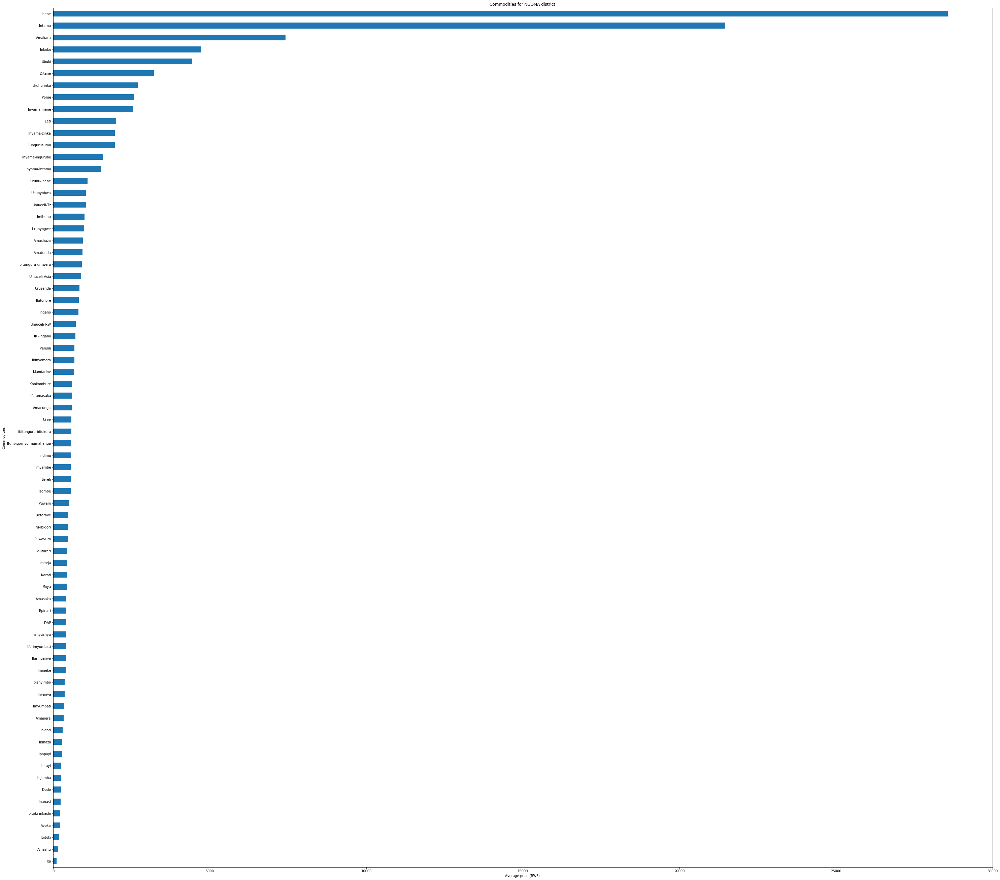

This for district BURERA 


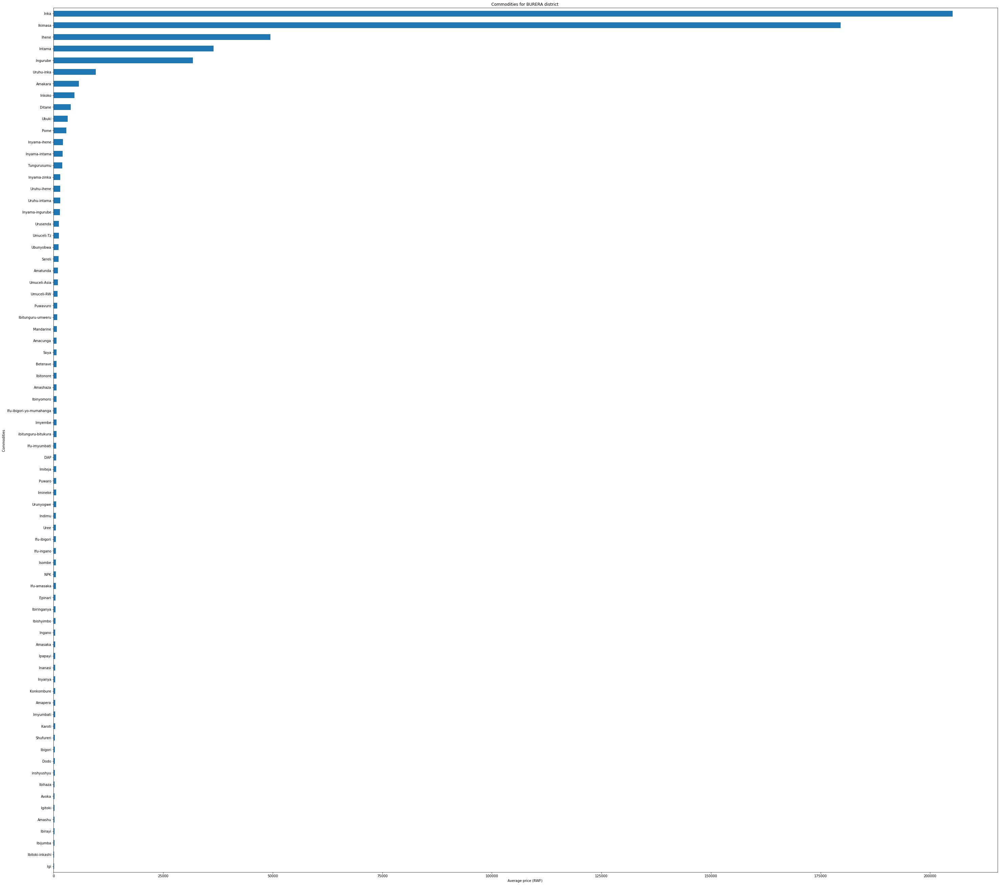

This for district NYARUGENGE 


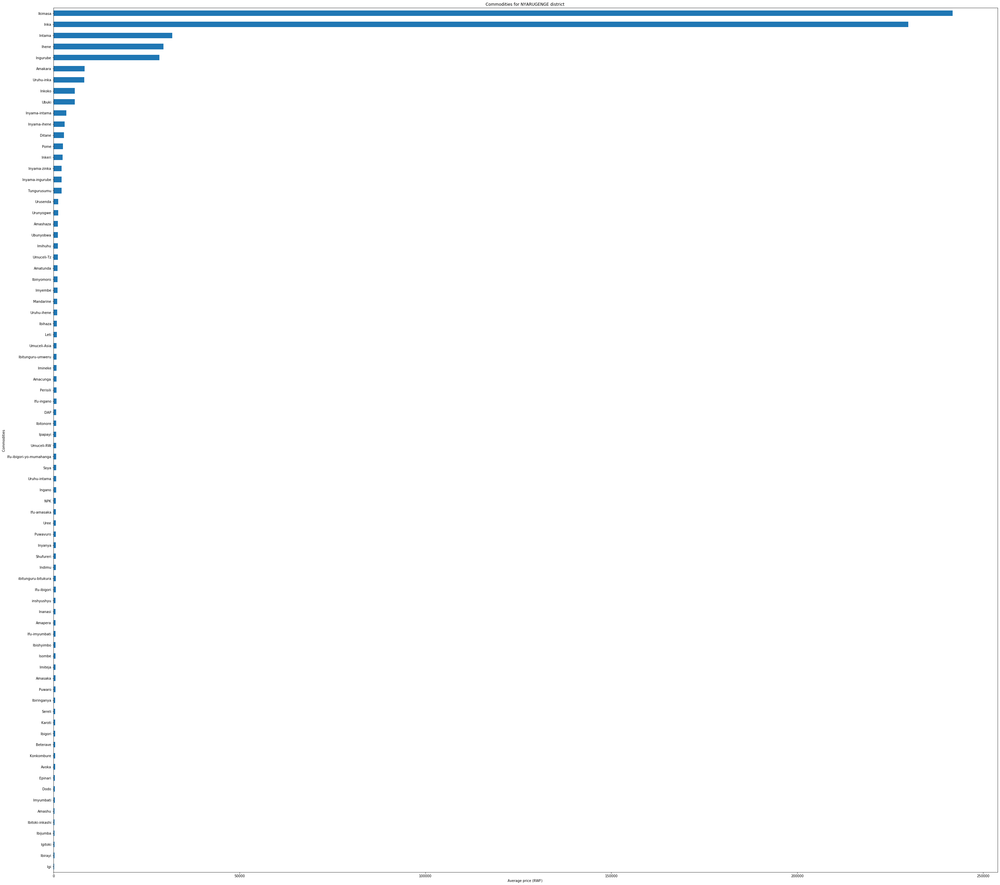

This for district NGORORERO 


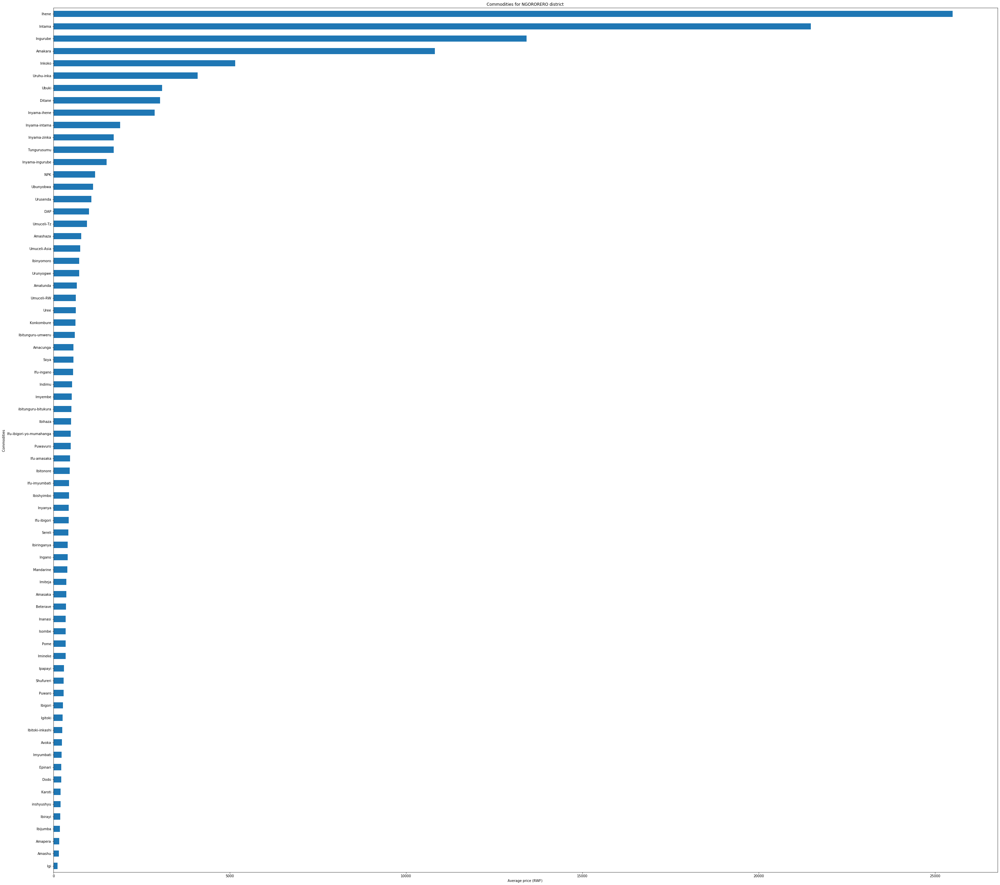

This for district RWAMAGANA 


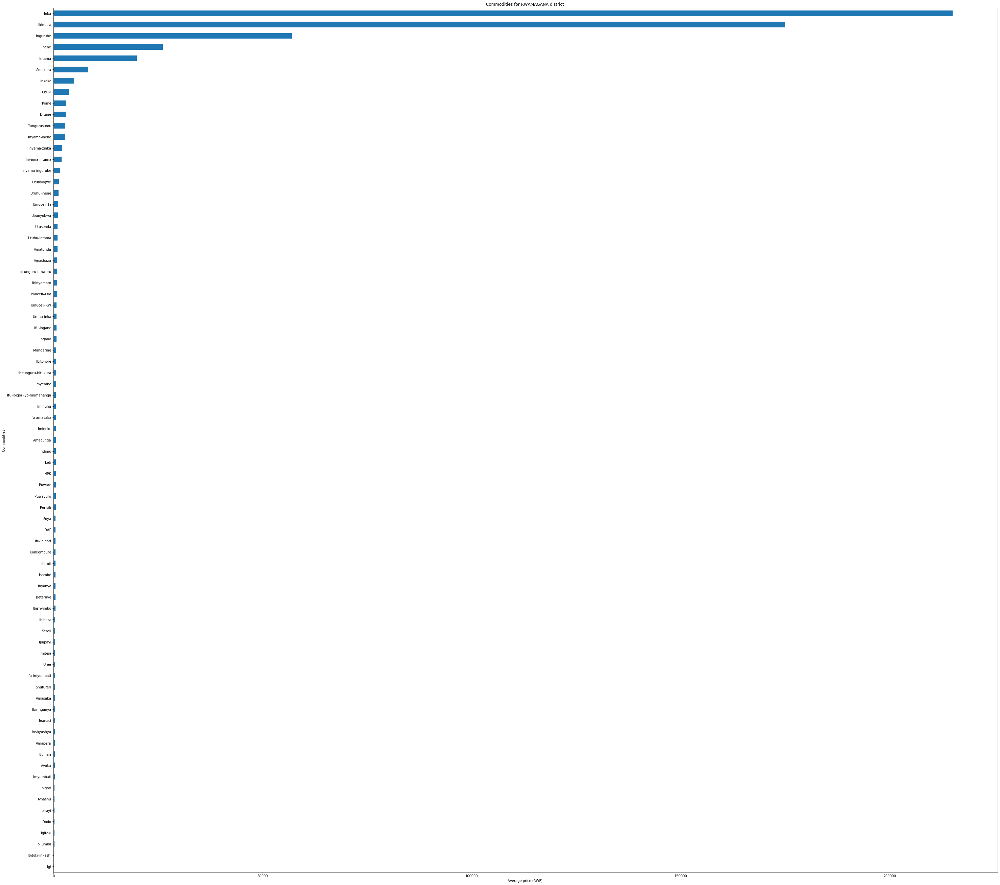

This for district NYAMASHEKE 


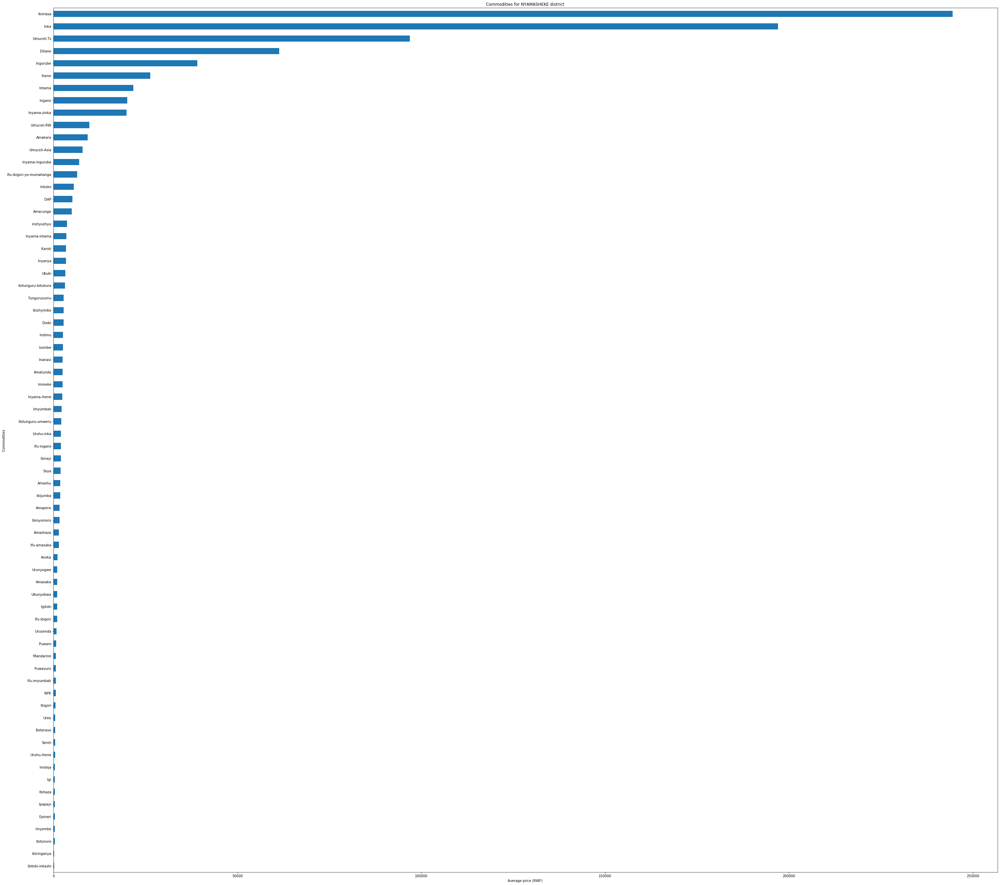

This for district RUSIZI 


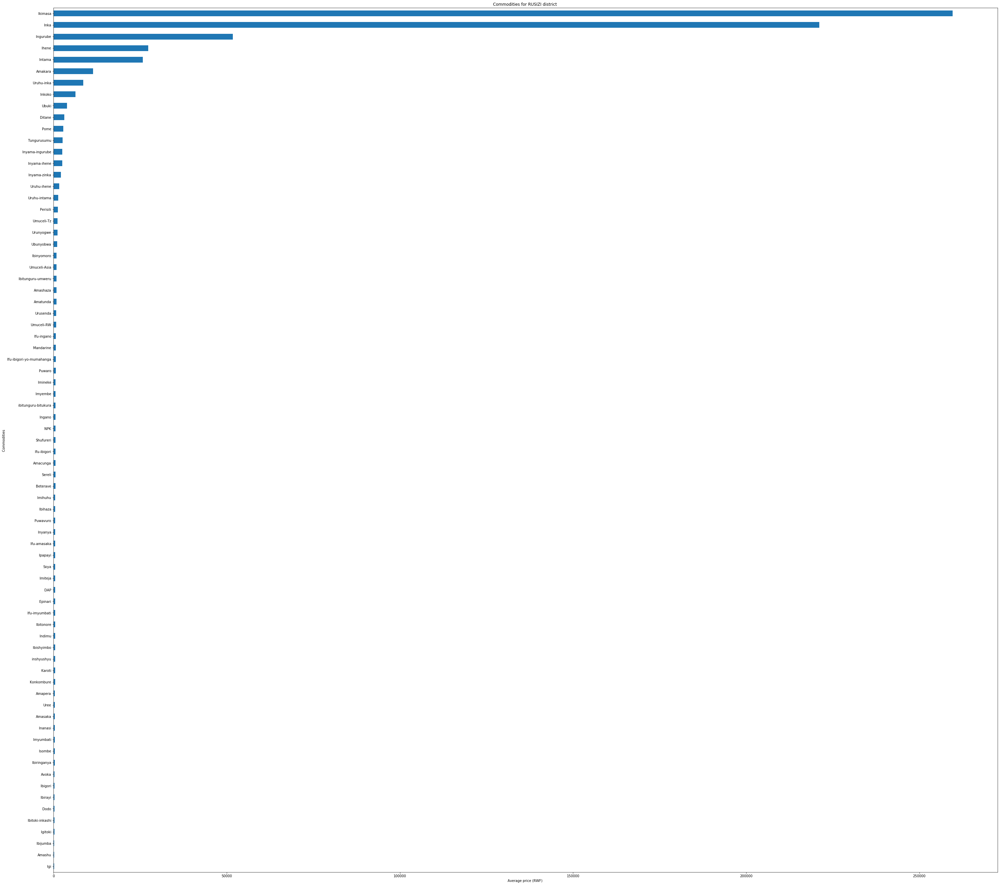

This for district KAMONYI 


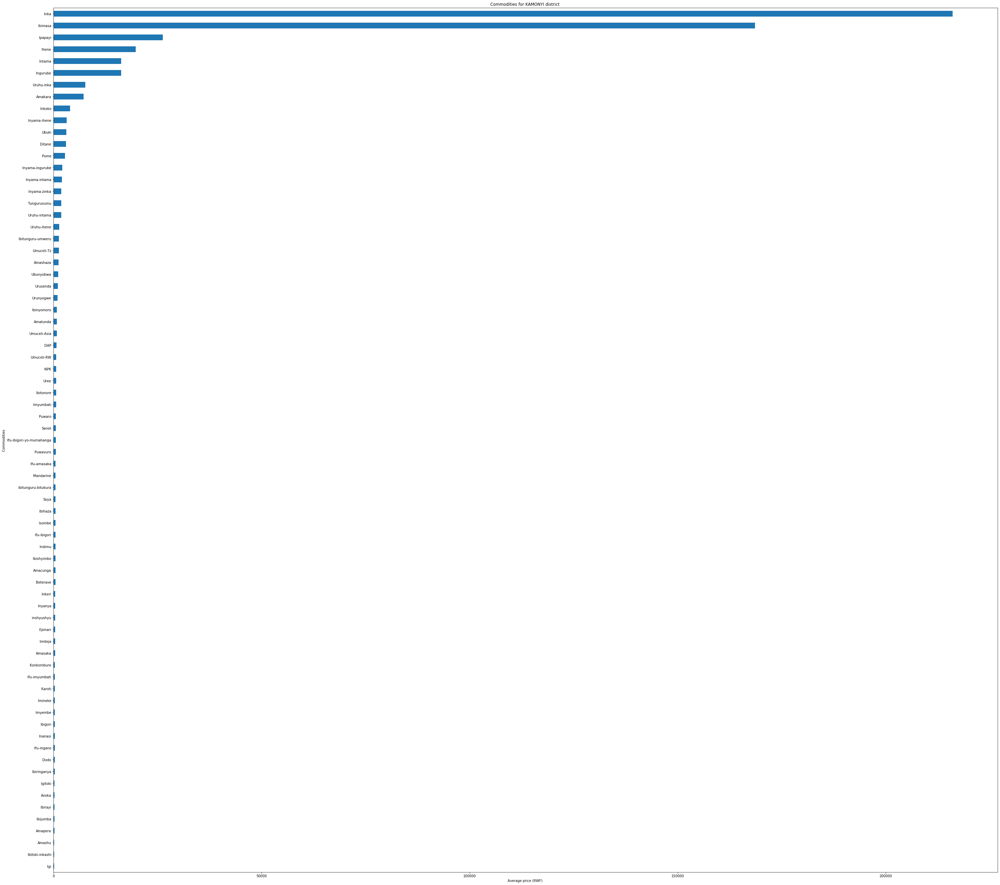

This for district KARONGI 


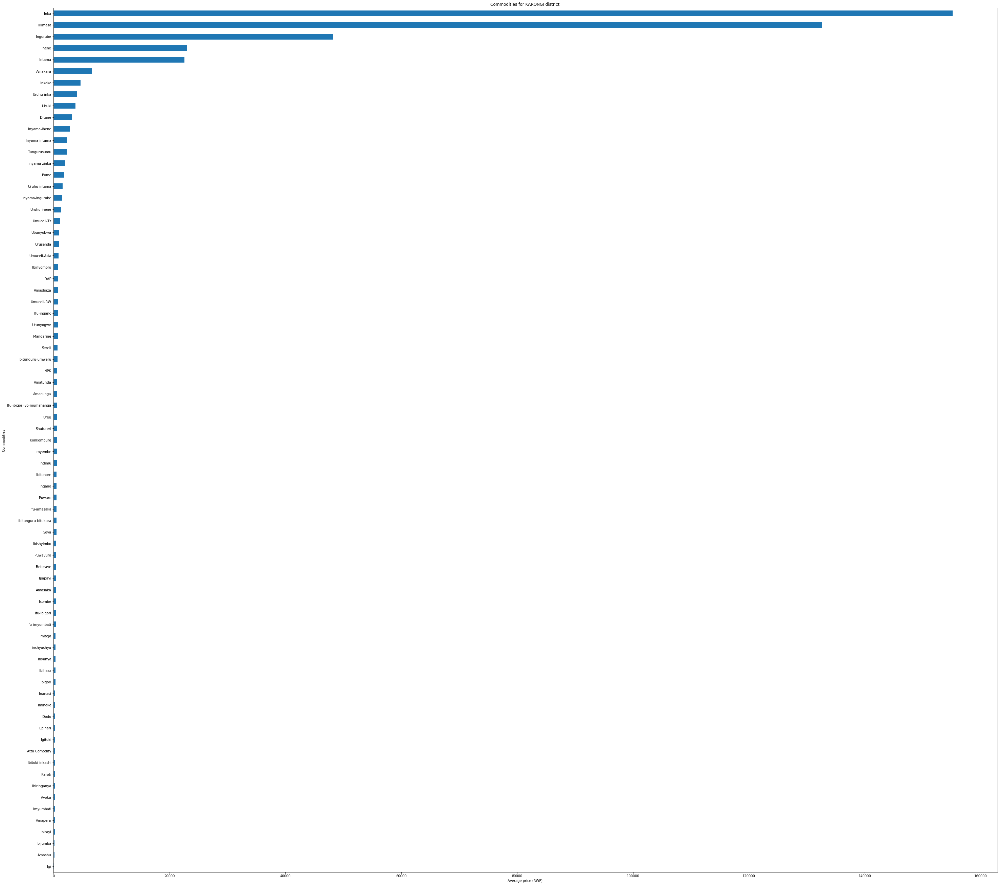

This for district RUBAVU 


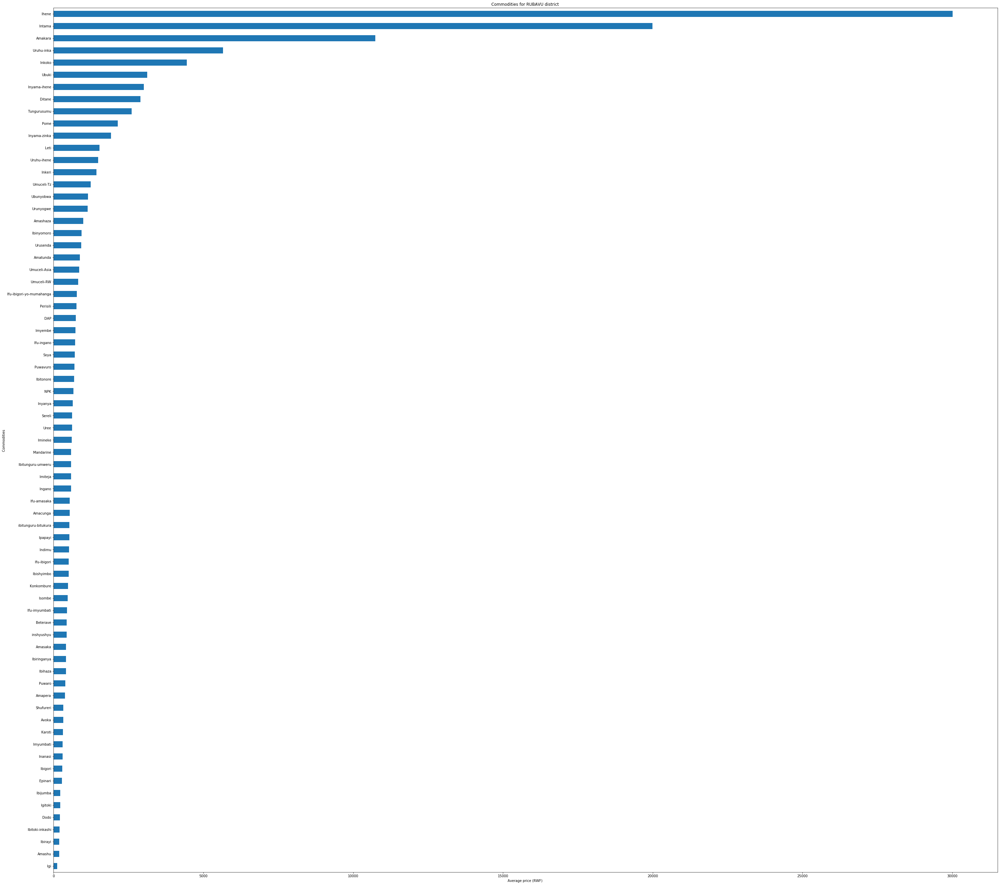

This for district RULINDO 


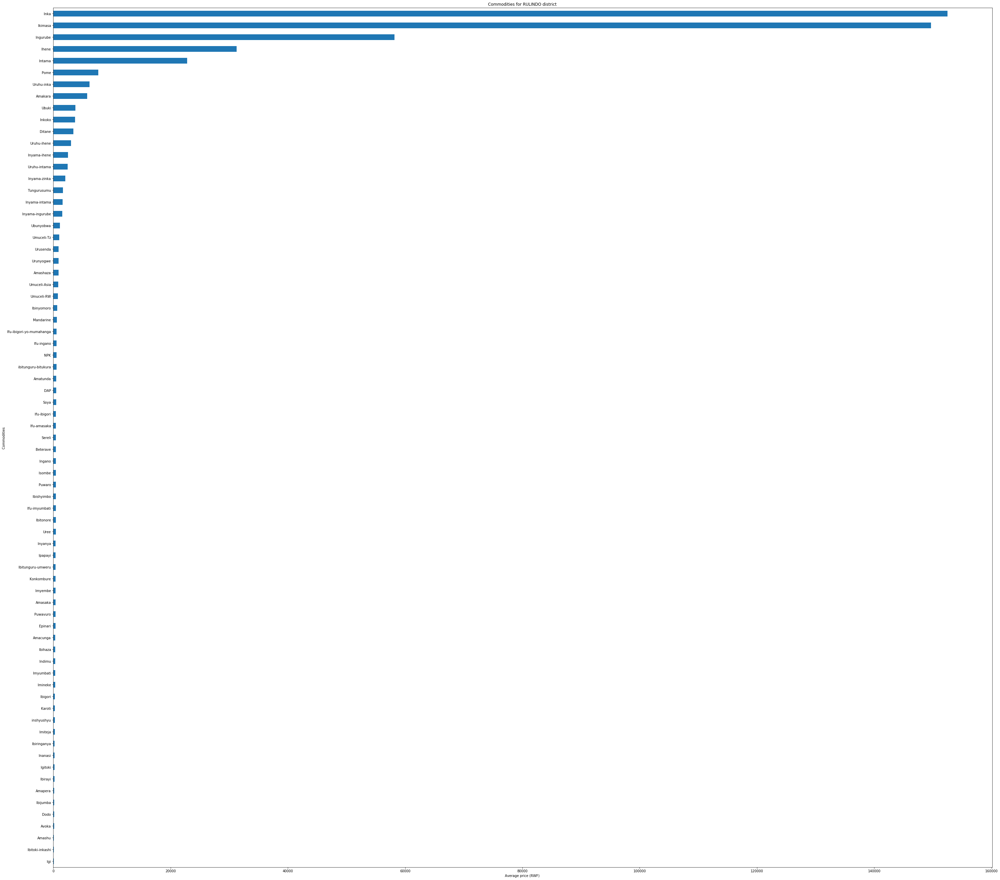

This for district BUGESERA 


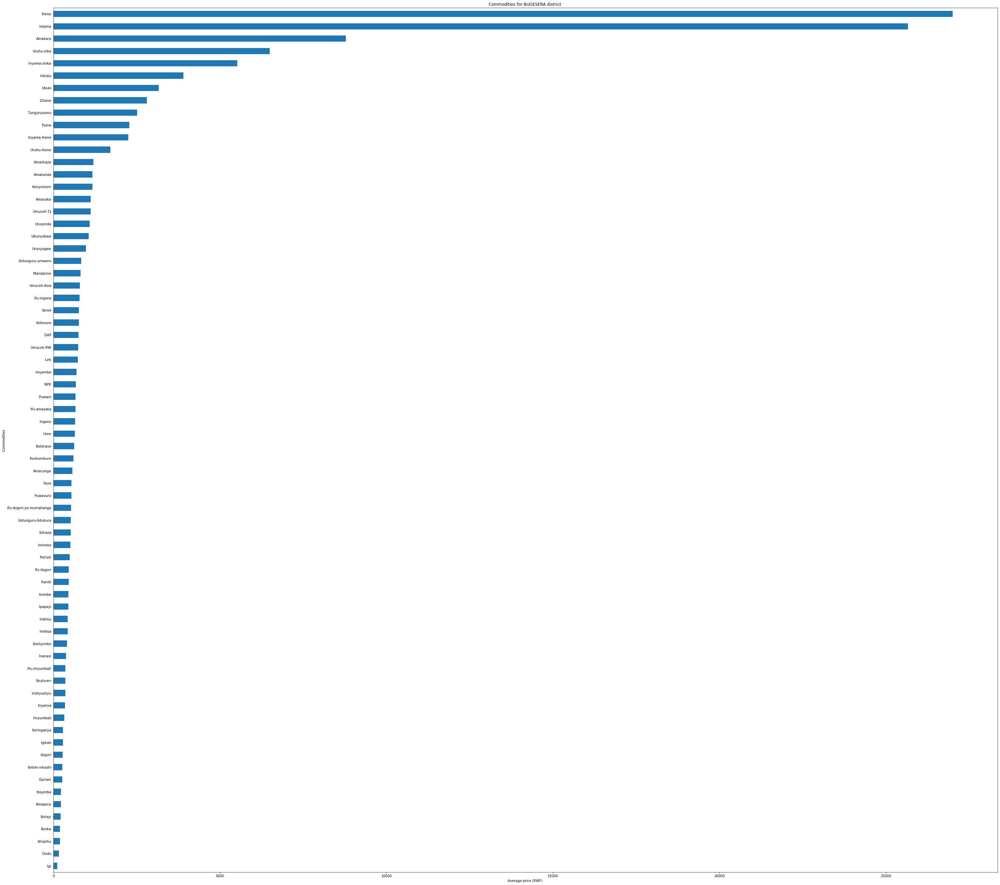

This for district GAKENKE 


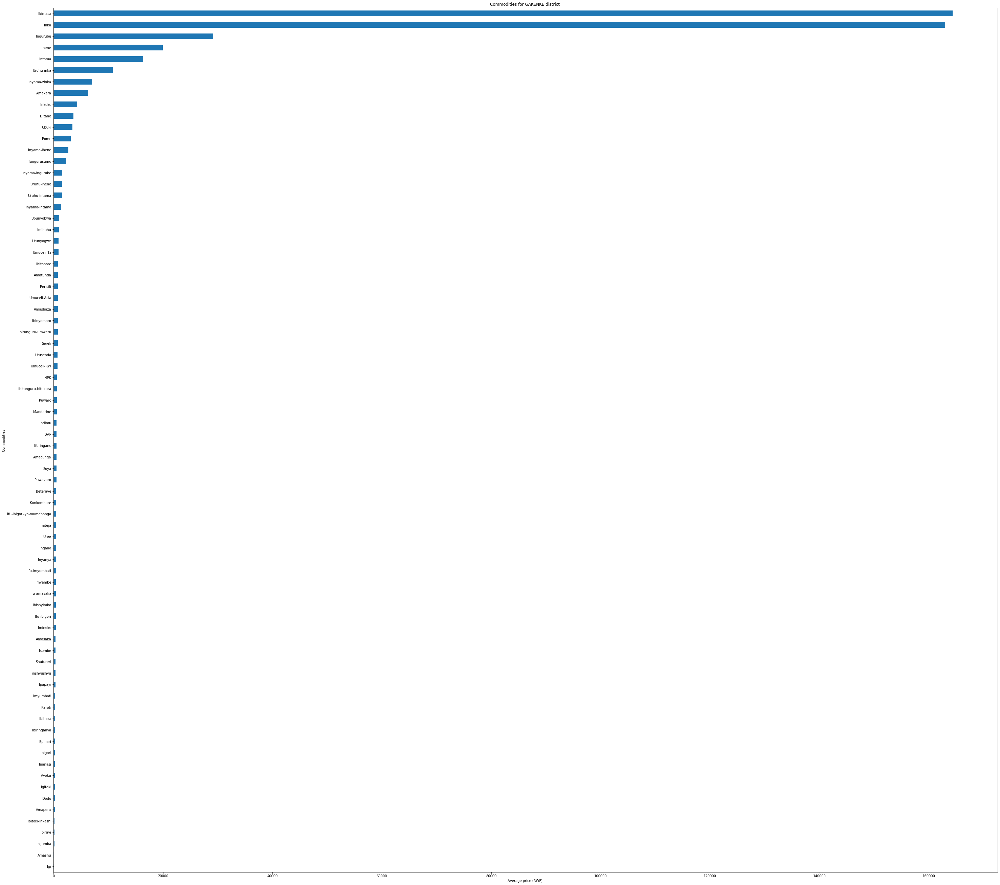

This for district NYARUGURU 


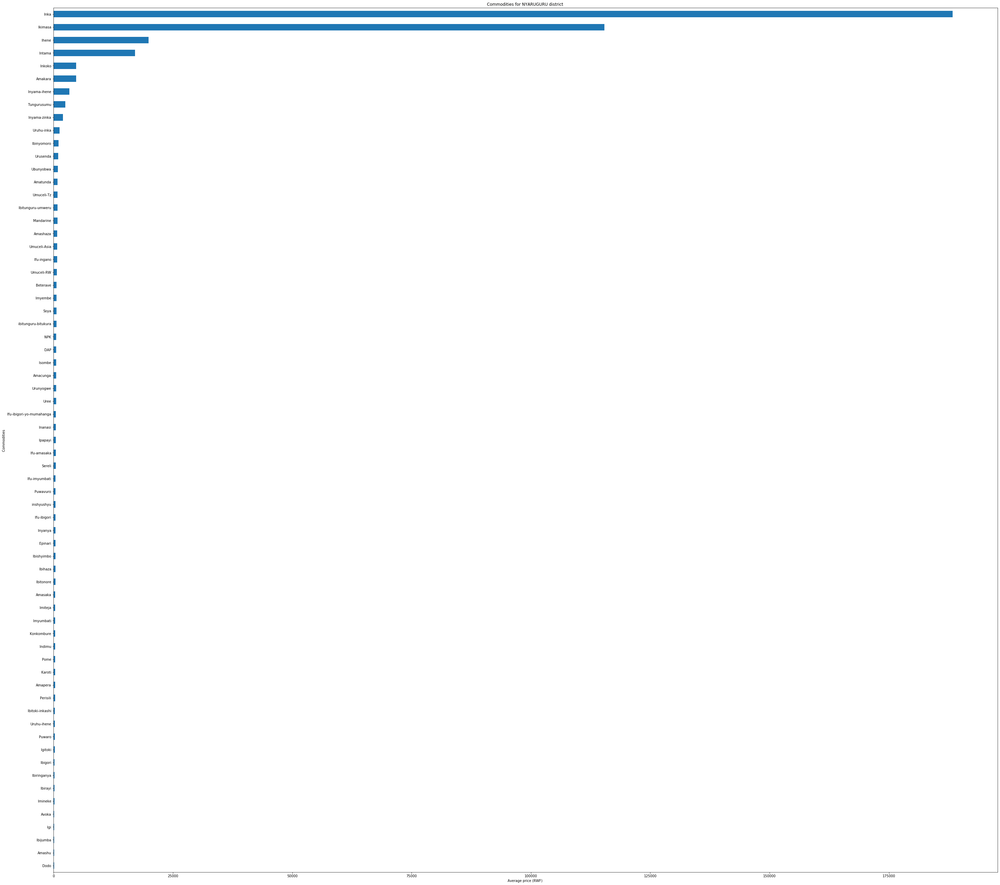

This for district MUHANGA 


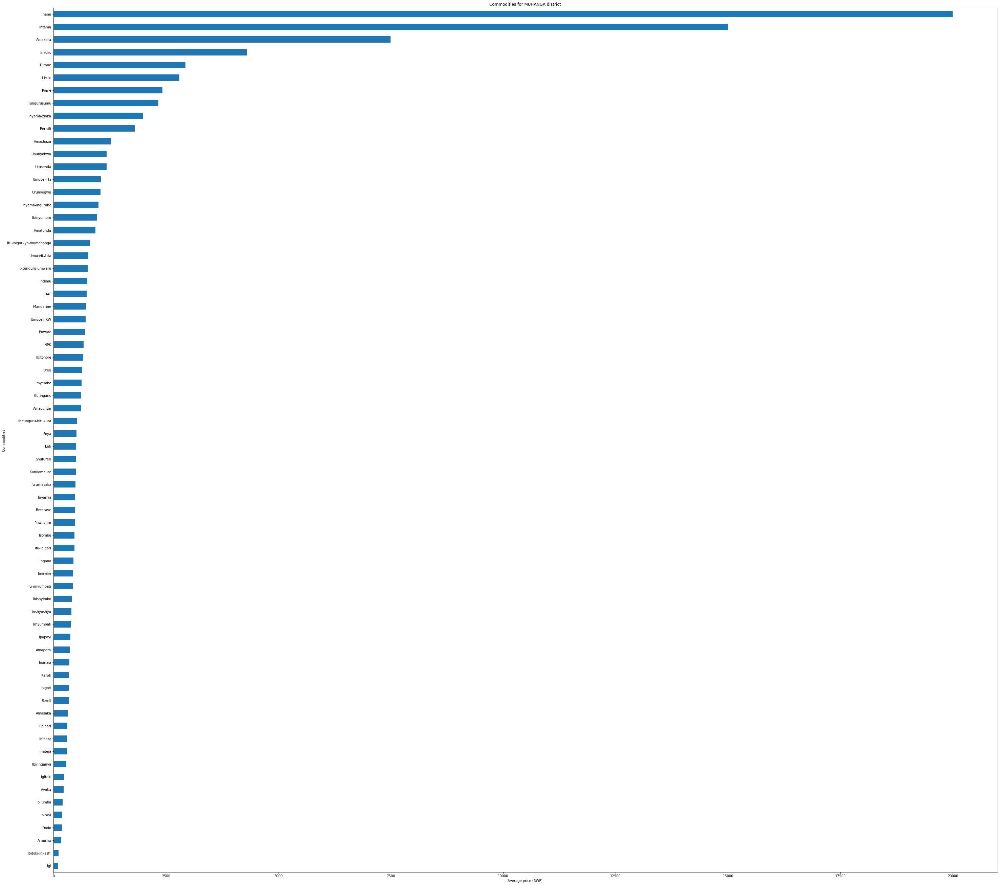

This for district HUYE 


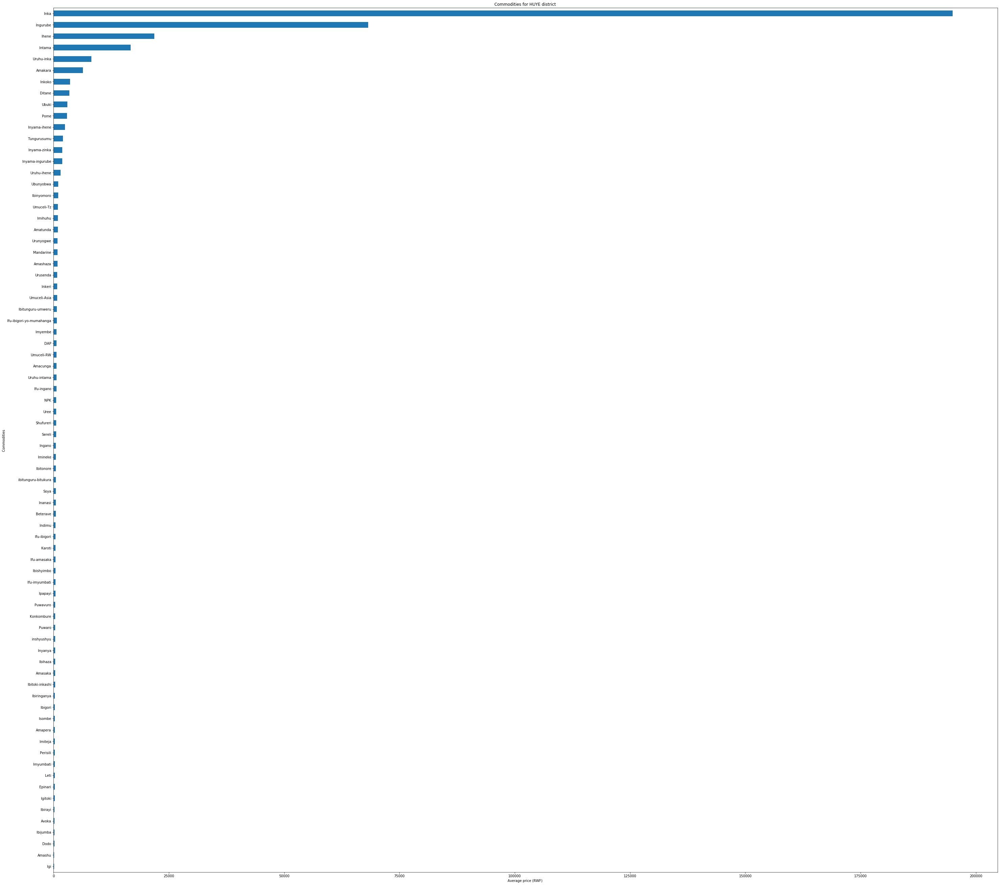

This for district MUSANZE 


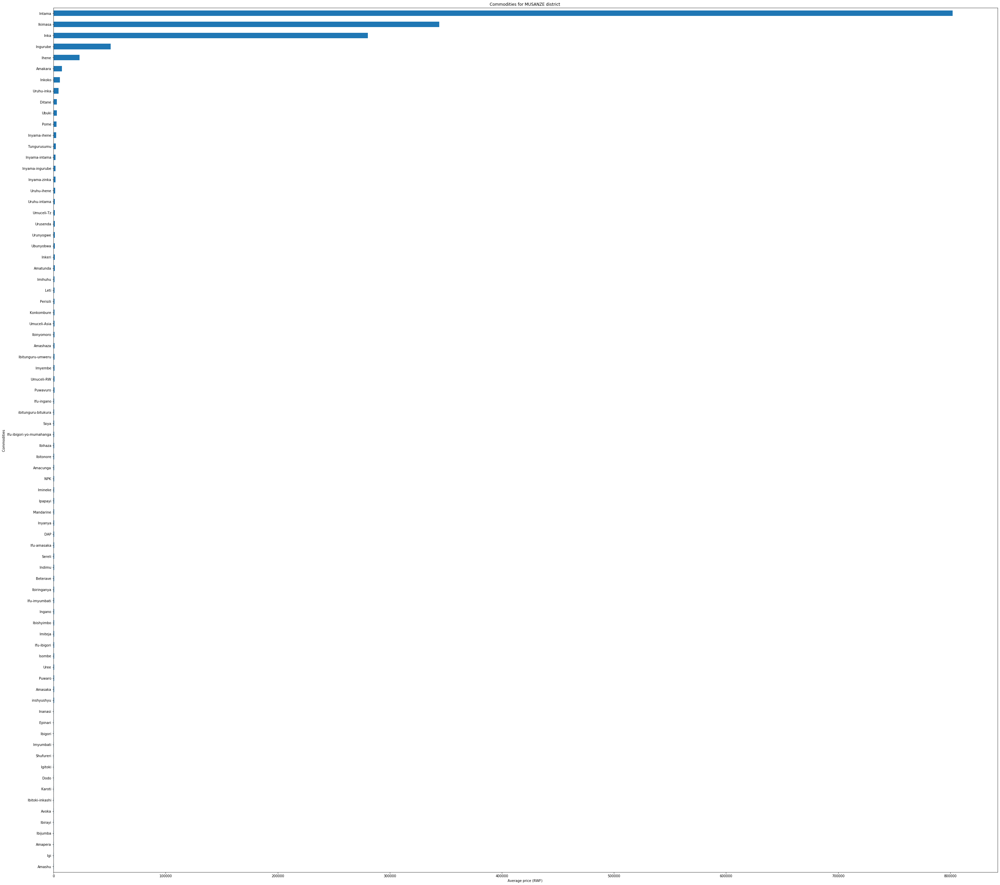

This for district KAYONZA 


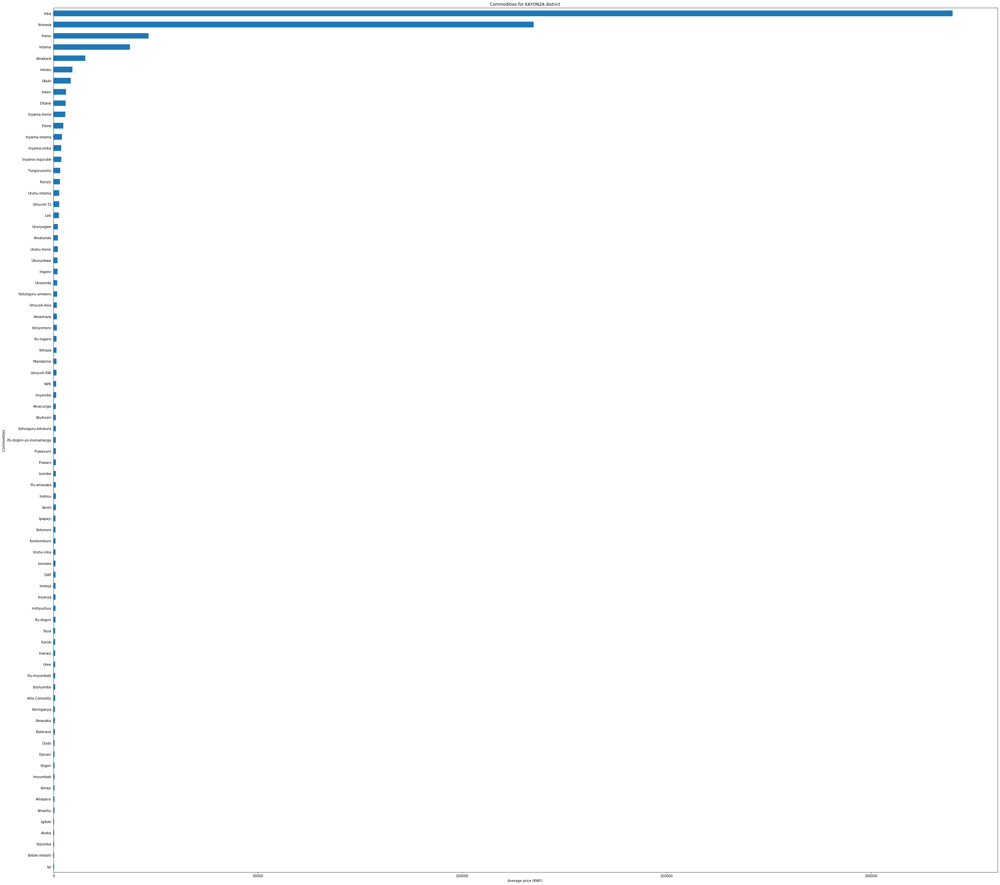

This for district RUHANGO 


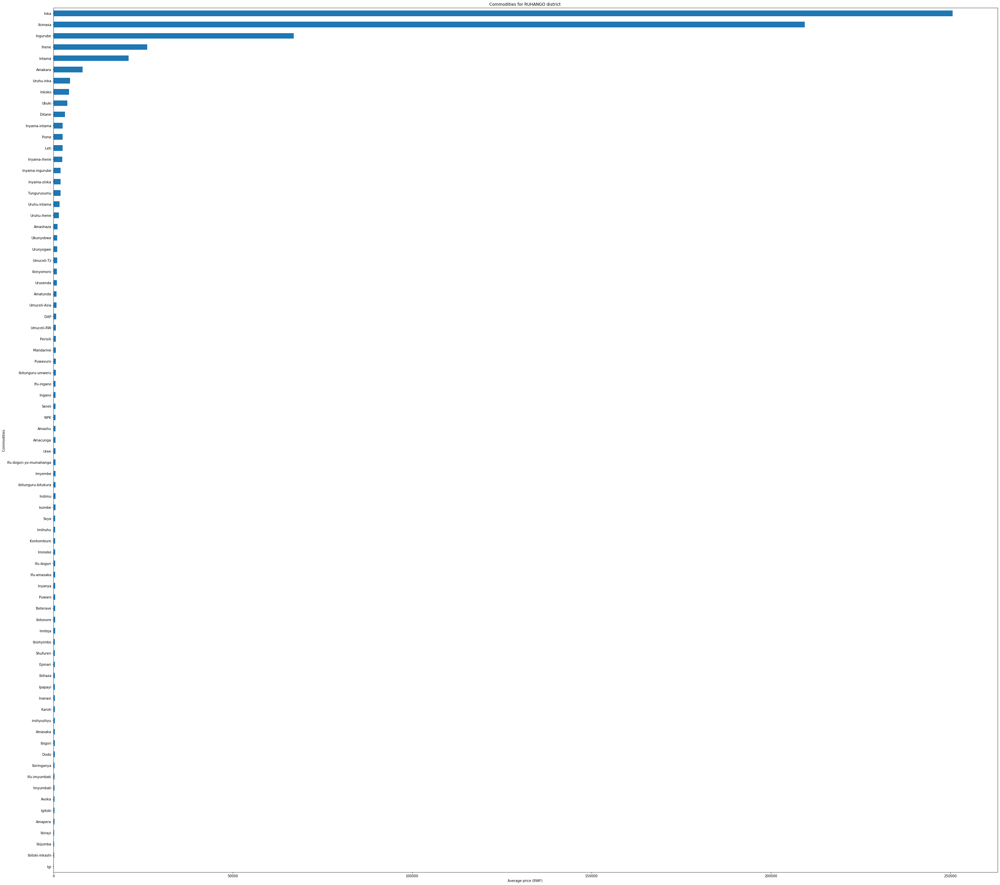

This for district GASABO 


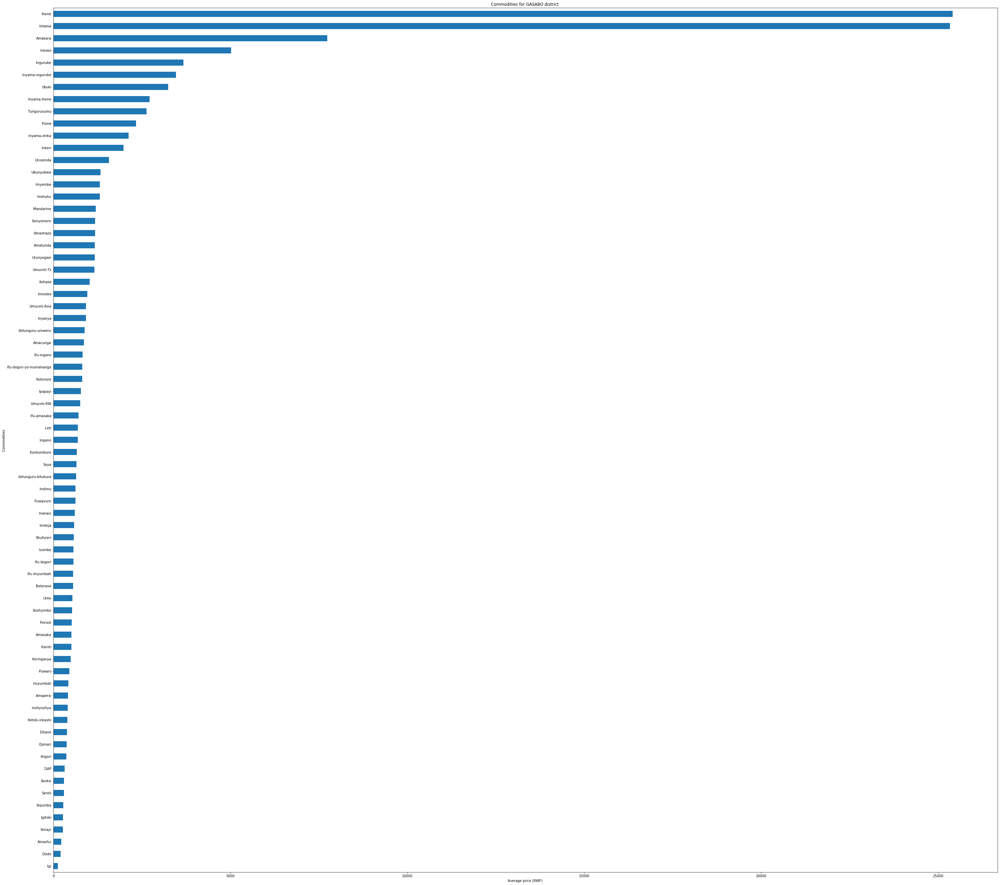

This for district GISAGARA 


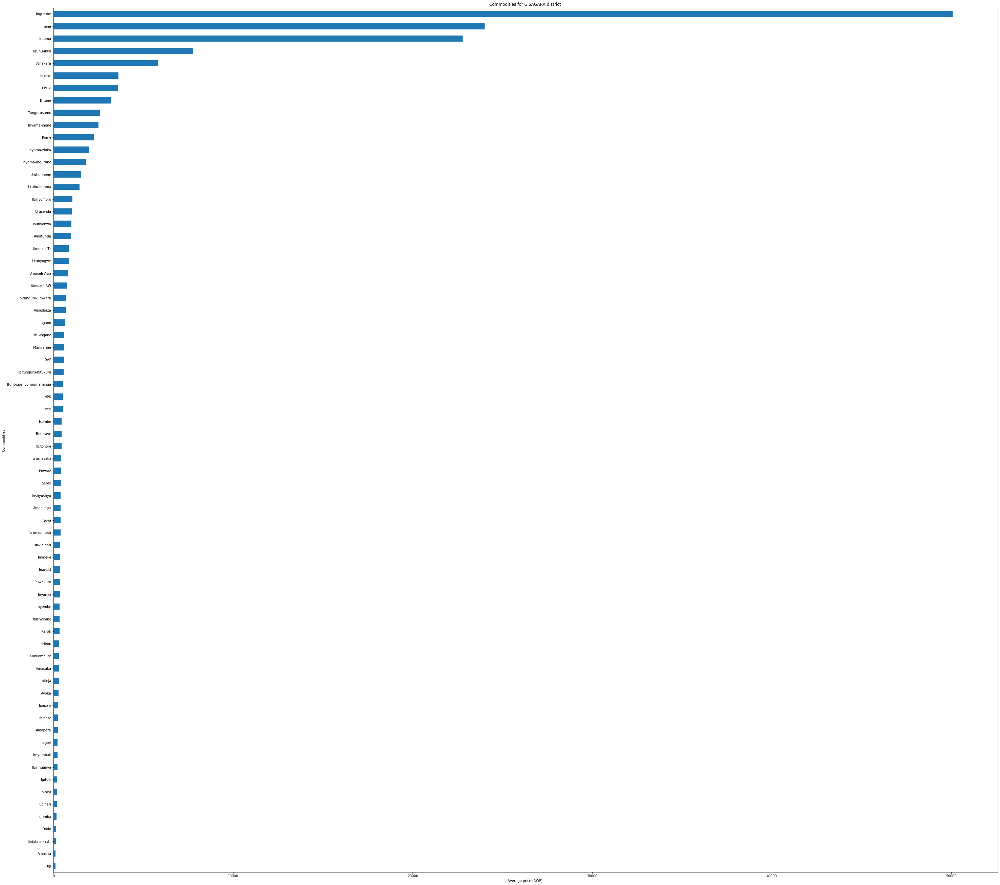

This for district NYAMAGABE 


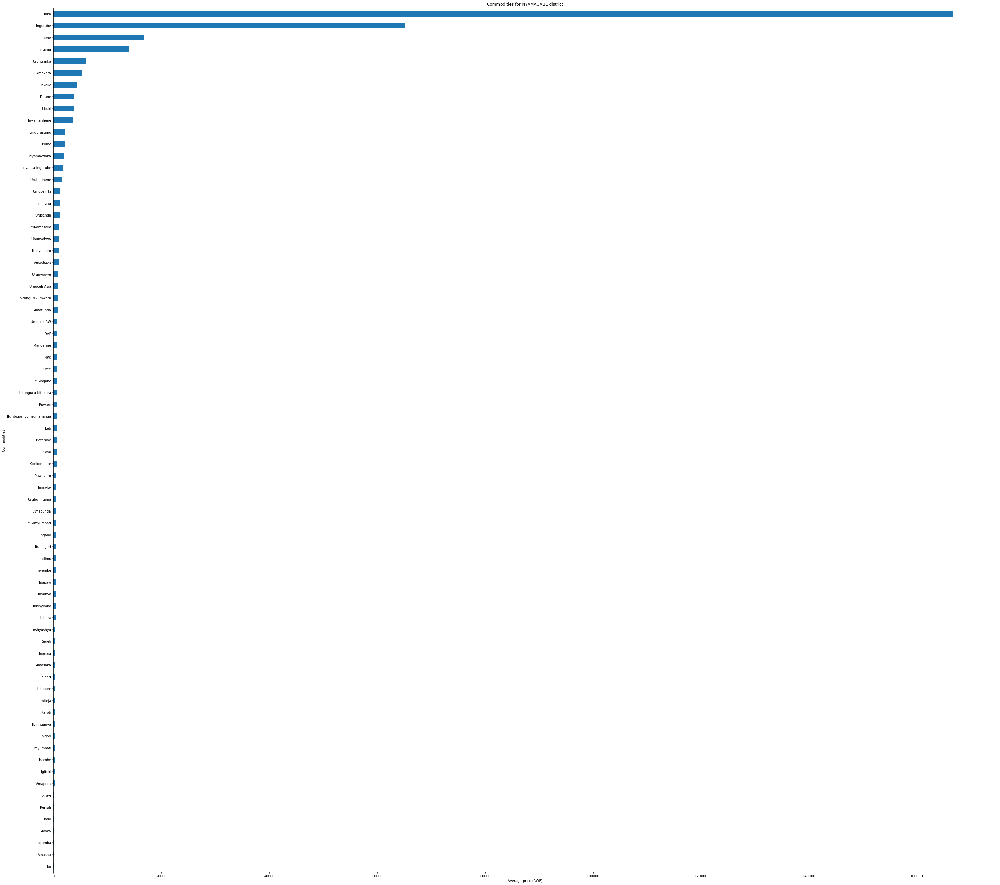

This for district RUTSIRO 


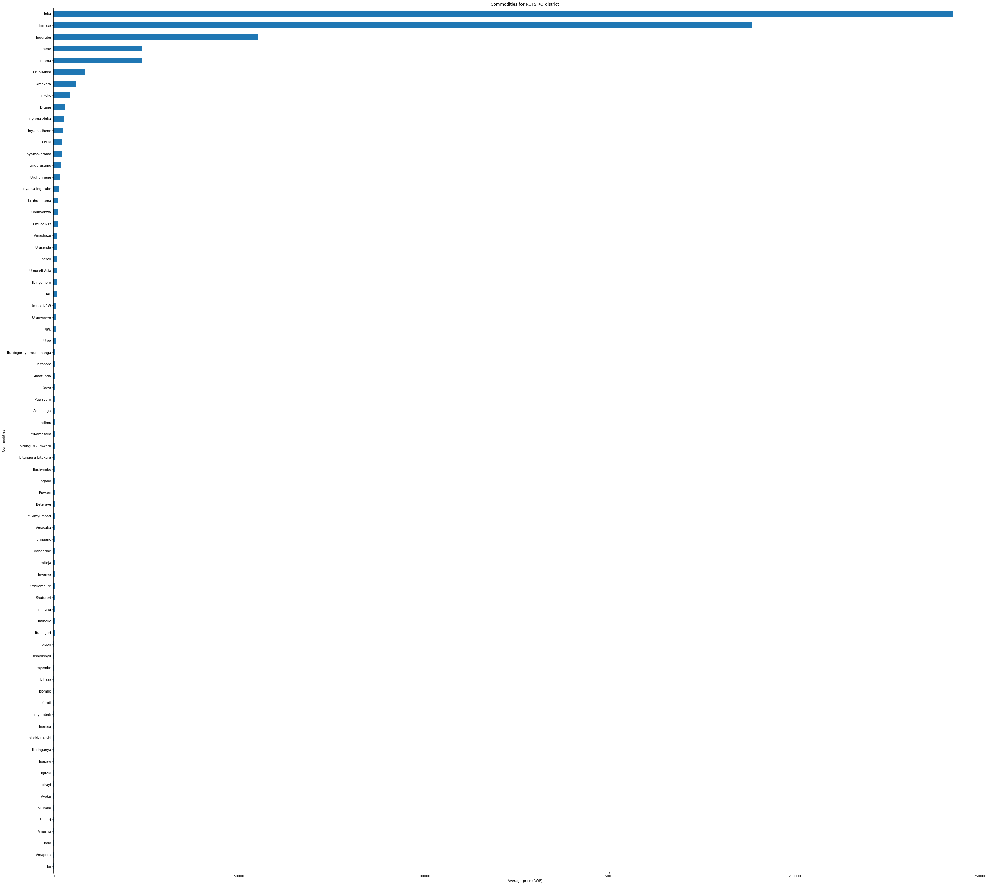

This for district NYABIHU 


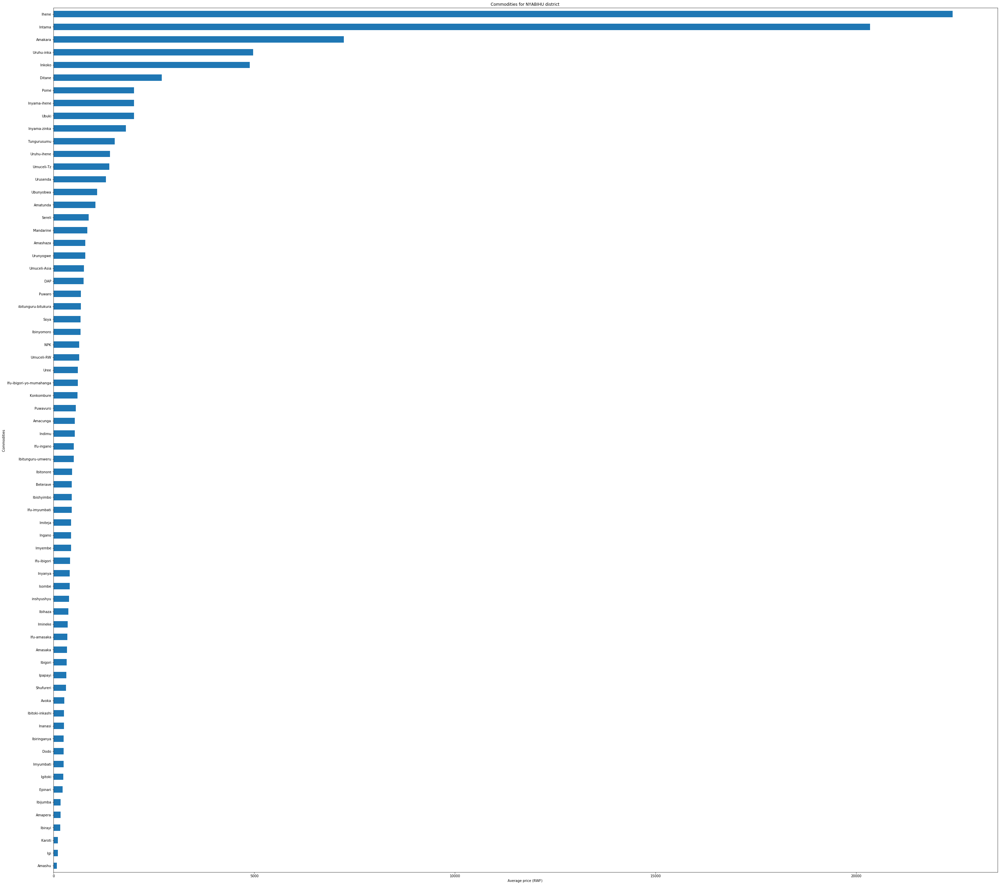

This for district NYANZA 


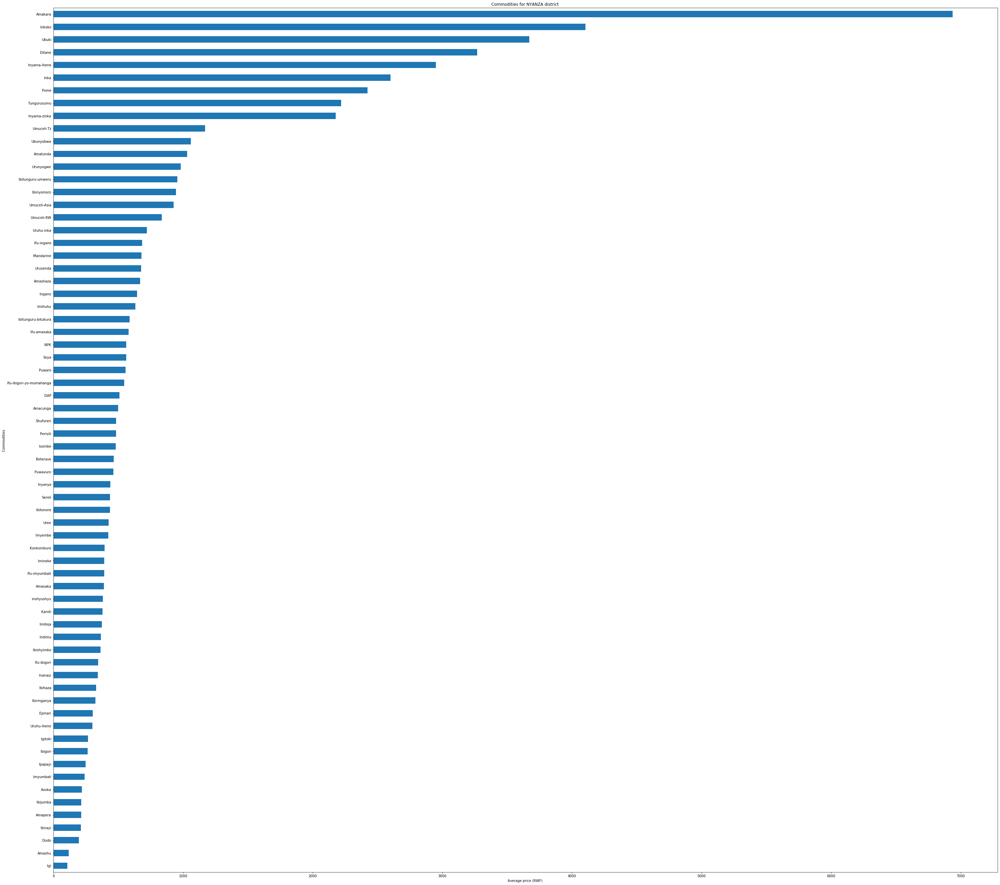

This for district KIREHE 


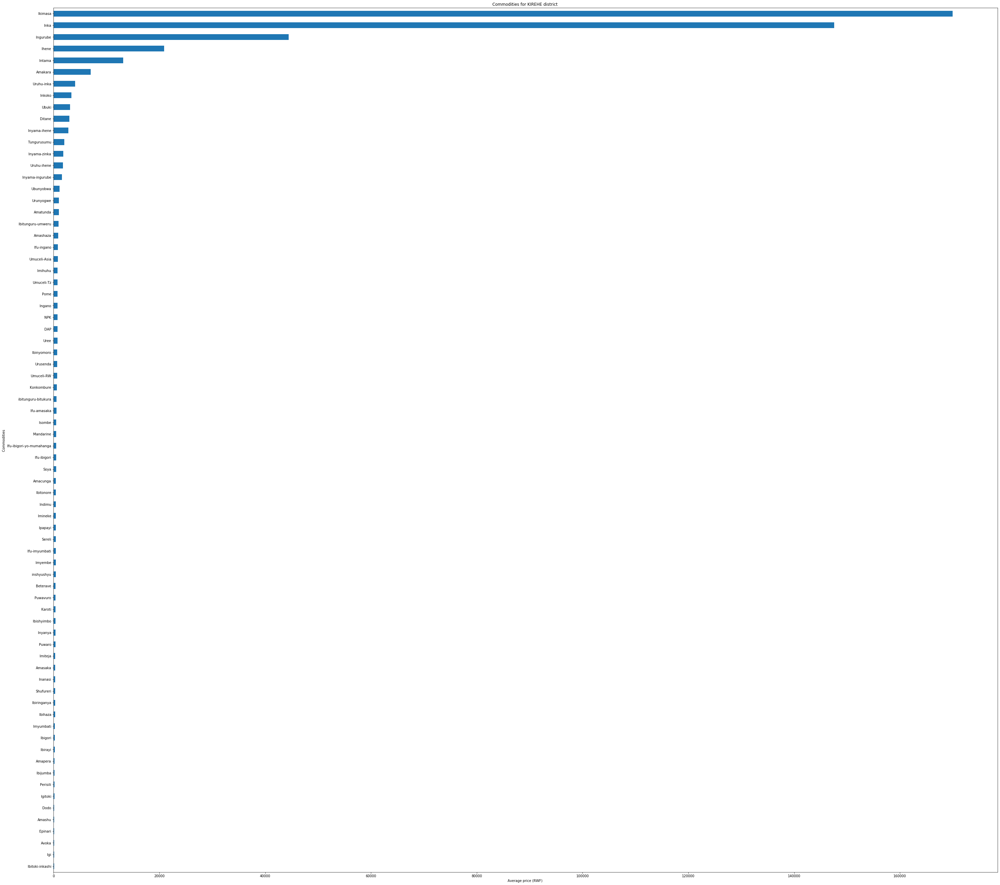

In [61]:
District_data = esoko['District'].unique().tolist()[:-1]
District_data

for district in District_data:
    displayCommoditiesAveragePricesPereachDistrict(str(district))

In [62]:
def selectByDistrict(districtName):
    districtName = str(districtName).upper()
    esokoDistrict = pd.read_csv('esoko.csv', index_col = 'District')
    return esokoDistrict.loc[districtName]


In [63]:
def selectDistrictMarkets(esokoDistrict, marketName):
    esokoDistrictByMarkets = esokoDistrict.set_index('Market')
    return esokoDistrictByMarkets.loc[str(marketName)].get(["Commodity", "Average Price","Date" ])

In [98]:
def selectDistrictMarketsCommodity(districtMarkets, commodityName):
    esokoDistrictByMarketByCommodity = districtMarkets.set_index("Commodity")
    return esokoDistrictByMarketByCommodity.loc[str(commodityName)]

def getDataPerYear(DistrictMarketsCommodity):
    Data2019 = []
    Data2018 = []
    Data2017 = []
    Data2016 = []
    Data2015 = []
    Data2014 = []
    Data2013 = []

    for i in range(len(DistrictMarketsCommodity['Average Price'])):
        if DistrictMarketsCommodity['Date'].values[i].find('2019') != -1:
            Data2019.append([DistrictMarketsCommodity['Date'].values[i], DistrictMarketsCommodity['Average Price'].values[i] ])

        elif DistrictMarketsCommodity['Date'].values[i].find('2018') != -1:
            Data2018.append([DistrictMarketsCommodity['Date'].values[i], DistrictMarketsCommodity['Average Price'].values[i] ]) 

        elif DistrictMarketsCommodity['Date'].values[i].find('2017') != -1:
            Data2017.append([DistrictMarketsCommodity['Date'].values[i], DistrictMarketsCommodity['Average Price'].values[i] ])

        elif DistrictMarketsCommodity['Date'].values[i].find('2016') != -1:
            Data2016.append([DistrictMarketsCommodity['Date'].values[i], DistrictMarketsCommodity['Average Price'].values[i] ])

        elif DistrictMarketsCommodity['Date'].values[i].find('2015') != -1:
            Data2015.append([DistrictMarketsCommodity['Date'].values[i], DistrictMarketsCommodity['Average Price'].values[i] ])

        elif DistrictMarketsCommodity['Date'].values[i].find('2014') != -1:
            Data2014.append([DistrictMarketsCommodity['Date'].values[i], DistrictMarketsCommodity['Average Price'].values[i] ])

        elif DistrictMarketsCommodity['Date'].values[i].find('2013') != -1:
            Data2013.append([DistrictMarketsCommodity['Date'].values[i], DistrictMarketsCommodity['Average Price'].values[i] ])
   
    return (Data2019,Data2018, Data2017, Data2016, Data2015, Data2014, Data2013)

  
def plotData( Data): 
    width_in_inches = 20
    height_in_inches = 20
    dots_per_inch = 50
    
    Data2019,Data2018, Data2017, Data2016, Data2015, Data2014, Data2013 = Data
    
    Data2019,Data2018, Data2017, Data2016, Data2015, Data2014, Data2013 = Data2019[::-1],Data2018[::-1], Data2017[::-1], Data2016[::-1], Data2015[::-1], Data2014[::-1], Data2013[::-1]
    
    fig, axs = plt.subplots(3,3 , figsize=(width_in_inches, height_in_inches), dpi=dots_per_inch)
    #fig.suptitle('Time series  Data for {}'.format(name))
    
    if len(Data2019) > 0:

        axs[(0, 0)].plot(np.array(Data2019)[:,0], np.array(Data2019)[:,1])
        axs[0, 0].grid(True)
        axs[0, 0].set_title('Year 2019')
        axs[0, 0].set_ylabel('Average price ')
        axs[0, 0].set_xlabel('Time')
        axs[0,0].xaxis.set_visible(True)
        axs[0,0].yaxis.set_visible(True)
        axs[0,0].set_xticklabels(np.array(Data2019)[:,0], rotation=80)
    
    if len(Data2018) > 0:

        axs[0, 1].plot(np.array(Data2018)[:,0], np.array(Data2018)[:,1], 'tab:orange')
        axs[0, 1].grid(True)
        axs[0, 1].set_title('Year 2018')
        axs[0, 1].set_ylabel('Average price ')
        axs[0, 1].set_xlabel('Time')
        axs[0, 1].xaxis.set_visible(True)
        axs[0, 1].yaxis.set_visible(True)
        axs[0, 1].set_xticklabels(np.array(Data2018)[:,0], rotation=80)

    if len(Data2017) > 0:
        axs[1, 0].plot(np.array(Data2017)[:,0], np.array(Data2017)[:,1], 'tab:green')
        axs[1, 0].set_title('Year 2017')
        axs[1, 0].set_ylabel('Average price ')
        axs[1, 0].set_xlabel('Time')
        axs[1, 0].xaxis.set_visible(True)
        axs[1, 0].yaxis.set_visible(True)
        axs[1, 0].grid(True)
        axs[1, 0].set_xticklabels(np.array(Data2017)[:,0], rotation=80)
    
    if len(Data2016) > 0:
        axs[1, 1].plot(np.array(Data2016)[:,0], np.array(Data2016)[:,1], 'tab:red')
        axs[1, 1].set_title('Year 2016')
        axs[1, 1].set_ylabel('Average price ')
        axs[1, 1].set_xlabel('Time')
        axs[1, 1].xaxis.set_visible(True)
        axs[1, 1].yaxis.set_visible(True)
        axs[1, 1].grid(True)
        axs[1, 1].set_xticklabels(np.array(Data2016)[:,0], rotation=80)
  
    if len(Data2015) > 0:
        axs[2, 0].plot(np.array(Data2015)[:,0], np.array(Data2015)[:,1], 'tab:red')
        axs[2, 0].set_title('Year 2015')
        axs[2, 0].set_ylabel('Average price ')
        axs[2, 0].set_xlabel('Time')
        axs[2, 0].xaxis.set_visible(True)
        axs[2, 0].yaxis.set_visible(True)
        axs[2, 0].grid(True)
        axs[2, 0].set_xticklabels(np.array(Data2015)[:,0], rotation=80)

    if len(Data2014) > 0:
        axs[2, 1].plot(np.array(Data2014)[:,0], np.array(Data2014)[:,1], 'tab:red')
        axs[2, 1].set_title('Year 2014')
        axs[2, 1].set_ylabel('Average price ')
        axs[2, 1].set_xlabel('Time')
        axs[2, 1].xaxis.set_visible(True)
        axs[2, 1].yaxis.set_visible(True)
        axs[2, 1].grid(True)
        axs[2, 1].set_xticklabels(np.array(Data2014)[:,0], rotation=80)
    
    if len(Data2013) > 0:
        axs[1, 2].plot(np.array(Data2013)[:,0], np.array(Data2013)[:,1], 'tab:red')
        axs[1, 2].set_title('Year 2013')
        axs[1, 2].set_ylabel('Average price ')
        axs[1, 2].set_xlabel('Time')
        axs[1, 2].xaxis.set_visible(True)
        axs[1, 2].yaxis.set_visible(True)
        axs[1, 2].grid(True)
        axs[1, 2].set_xticklabels(np.array(Data2013)[:,0], rotation=80)

    fig.tight_layout()
    plt.show()
  

In [99]:
def displayTimeSeriesData( districtName, marketName):
    district = selectByDistrict(districtName)
    districtMarket = selectDistrictMarkets(district, marketName )
    commodity_data = districtMarket['Commodity'].unique().tolist()
    for commodity in commodity_data:
        print( " Time series plot for {} in {} market of {} districts ".format(commodity,marketName ,districtName))
        districtMarketCommodity = selectDistrictMarketsCommodity(districtMarket, str(commodity))
        data = getDataPerYear(districtMarketCommodity)
        plotData(data)

 Time series plot for Inkoko in Bushenge market of Nyamasheke districts 


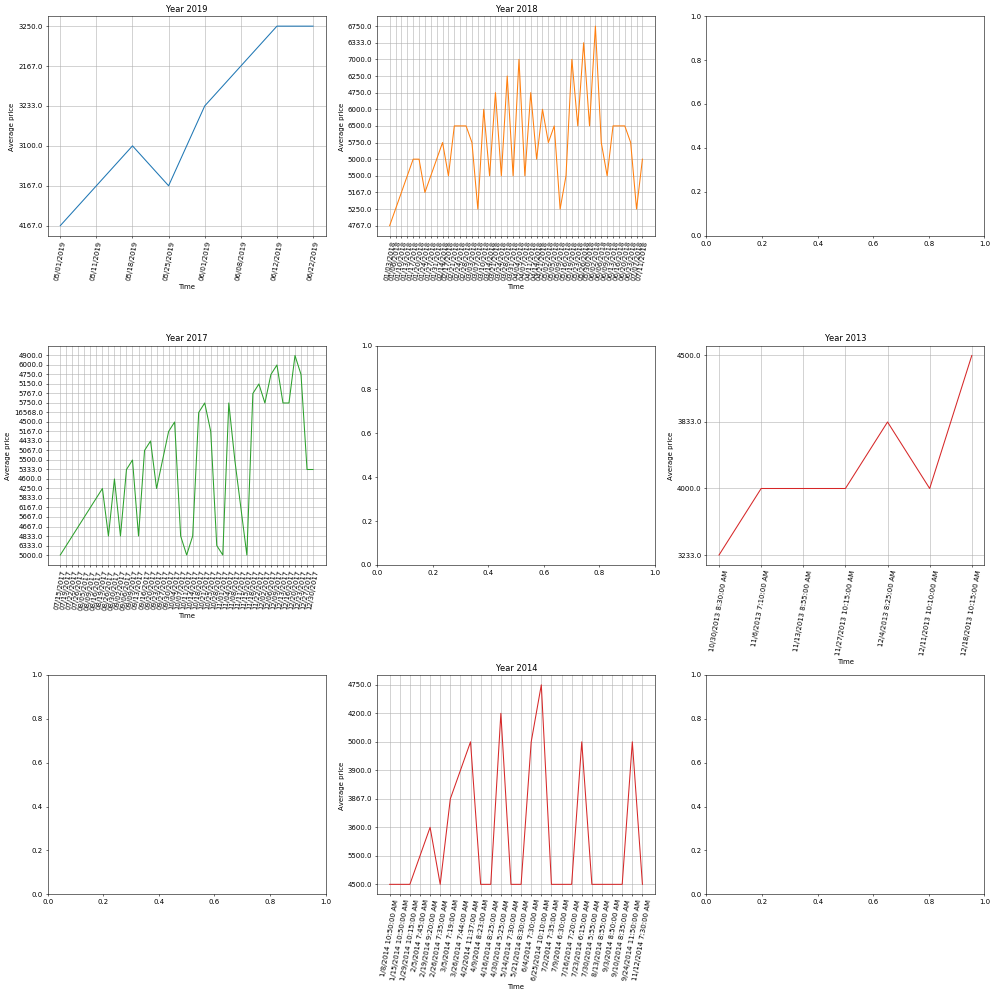

 Time series plot for Ingurube in Bushenge market of Nyamasheke districts 


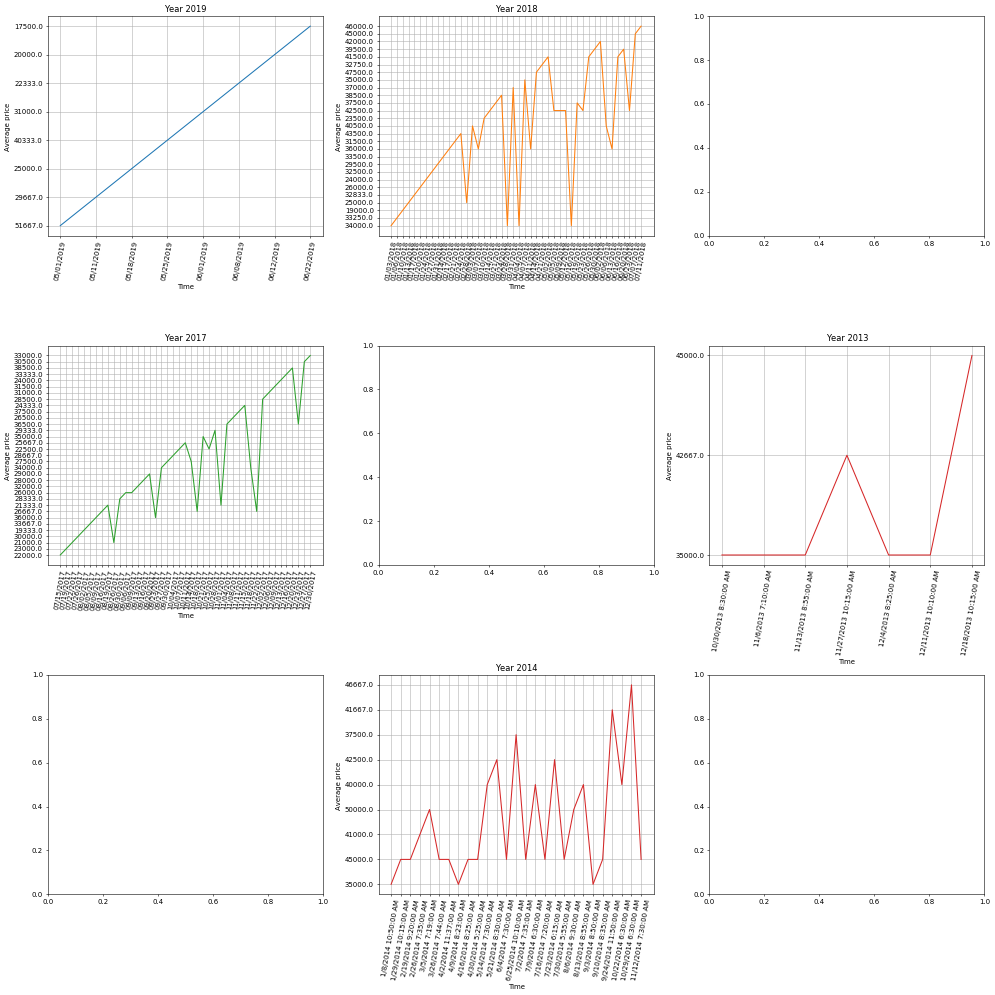

 Time series plot for Ihene in Bushenge market of Nyamasheke districts 


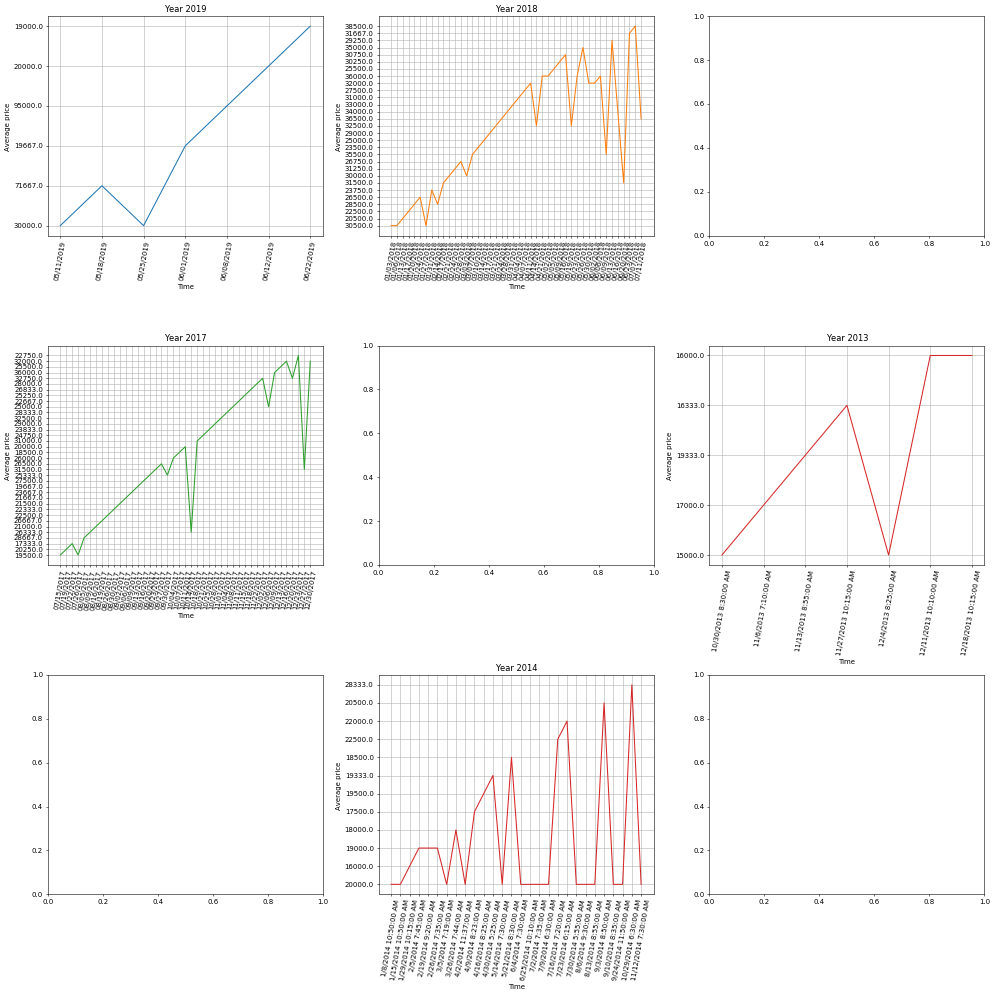

 Time series plot for Intama in Bushenge market of Nyamasheke districts 


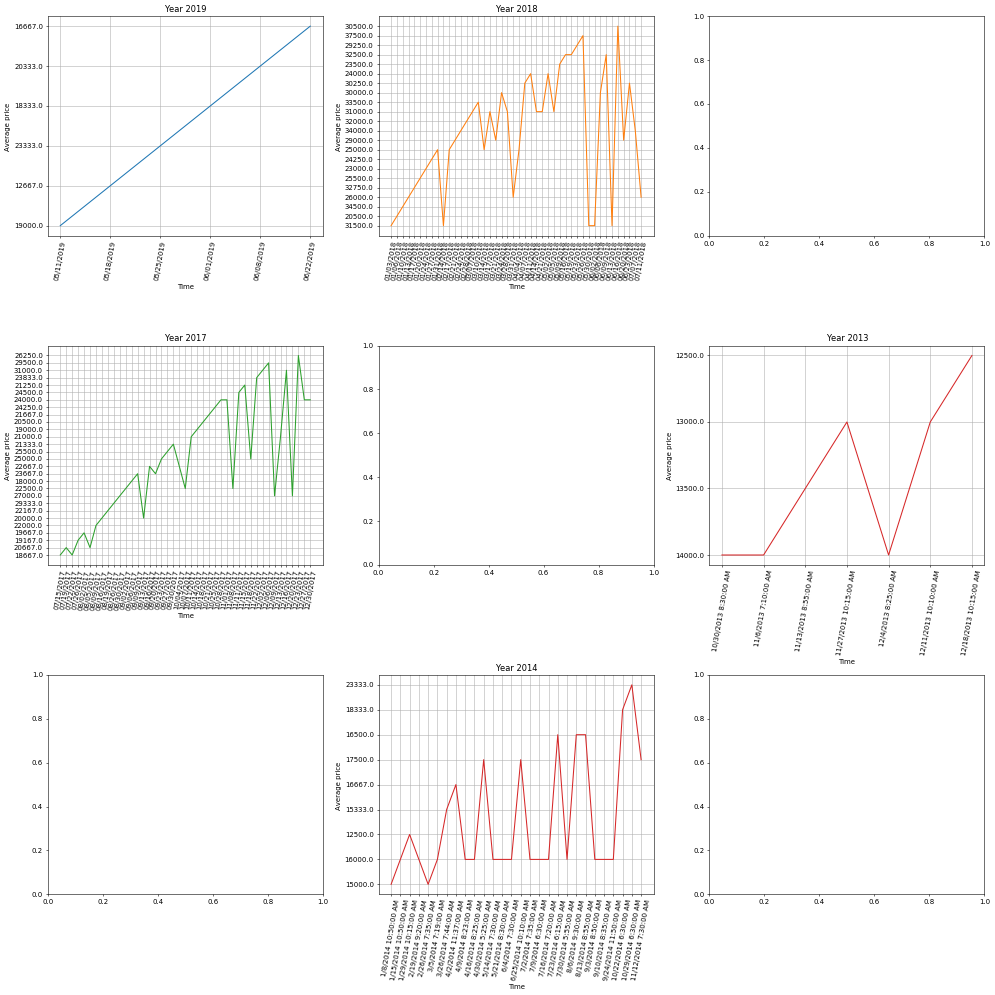

 Time series plot for Ibinyomoro in Bushenge market of Nyamasheke districts 


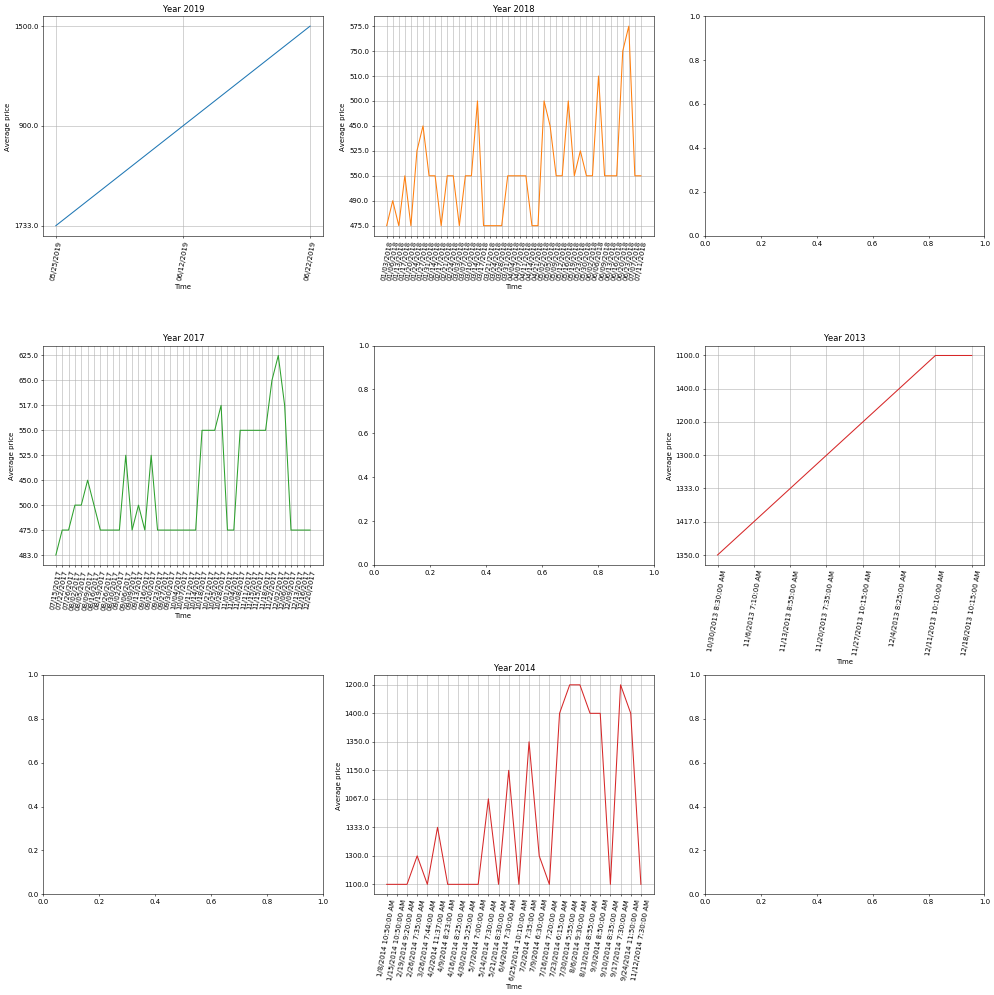

 Time series plot for Soya in Bushenge market of Nyamasheke districts 


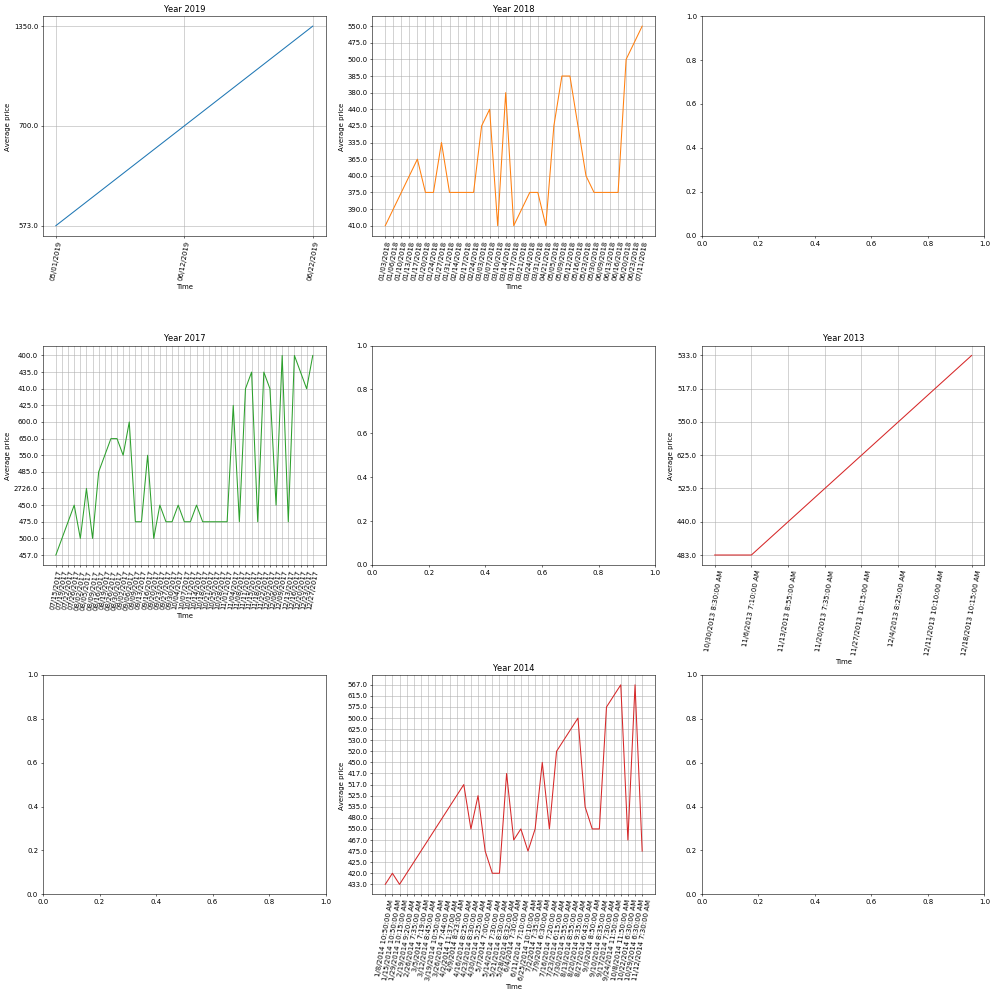

 Time series plot for Amashaza in Bushenge market of Nyamasheke districts 


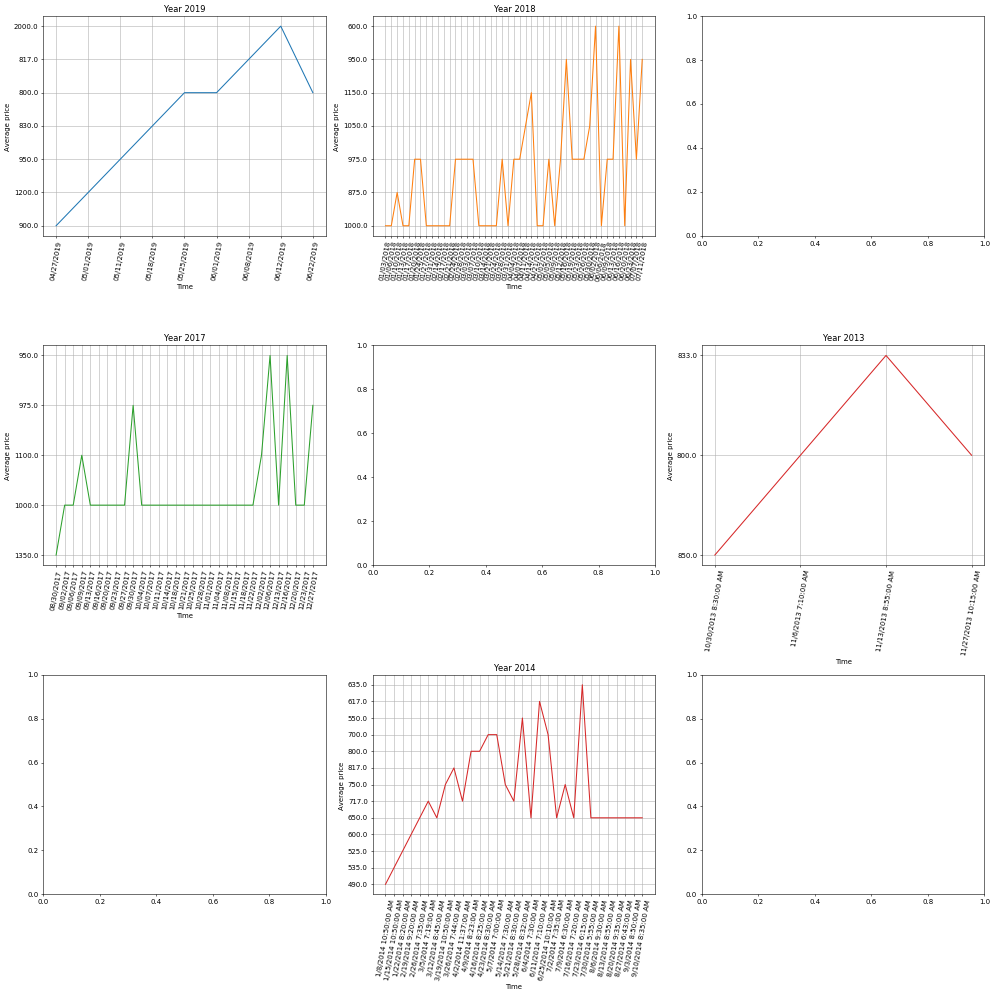

 Time series plot for Puwavuro in Bushenge market of Nyamasheke districts 


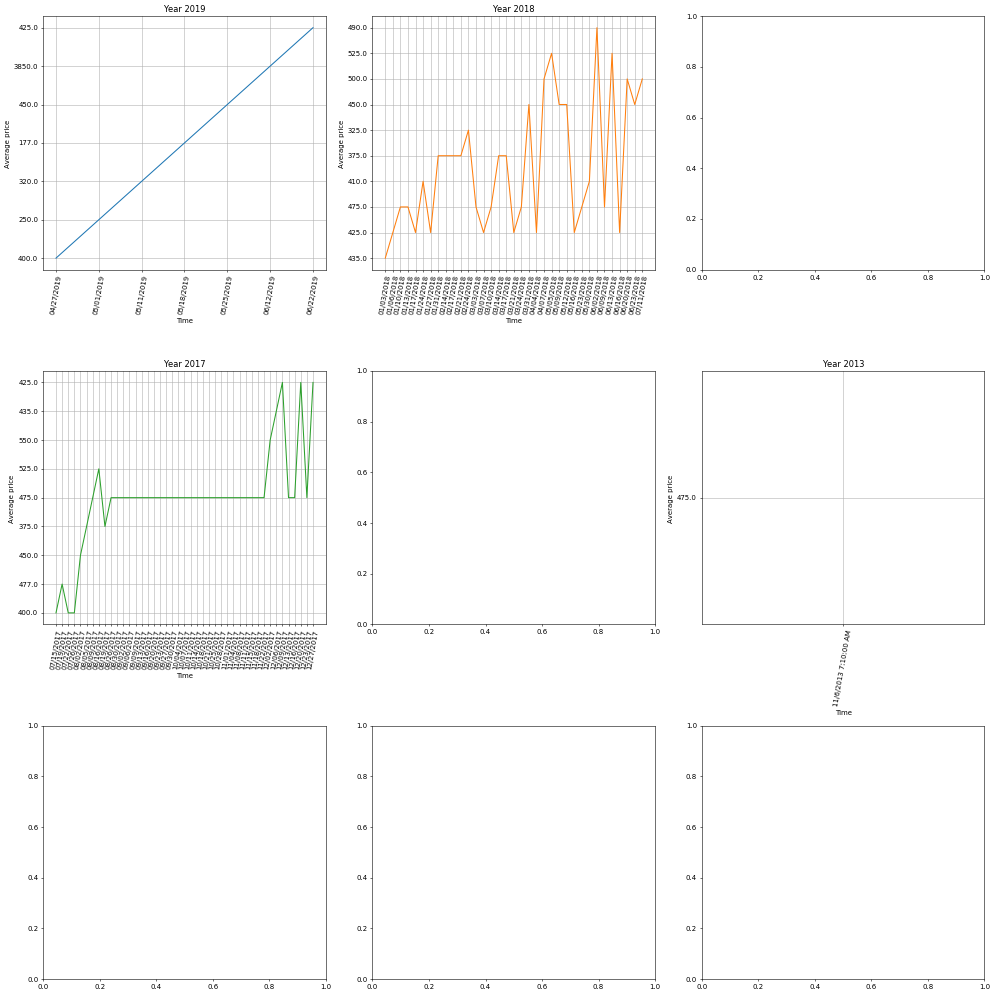

 Time series plot for Karoti in Bushenge market of Nyamasheke districts 


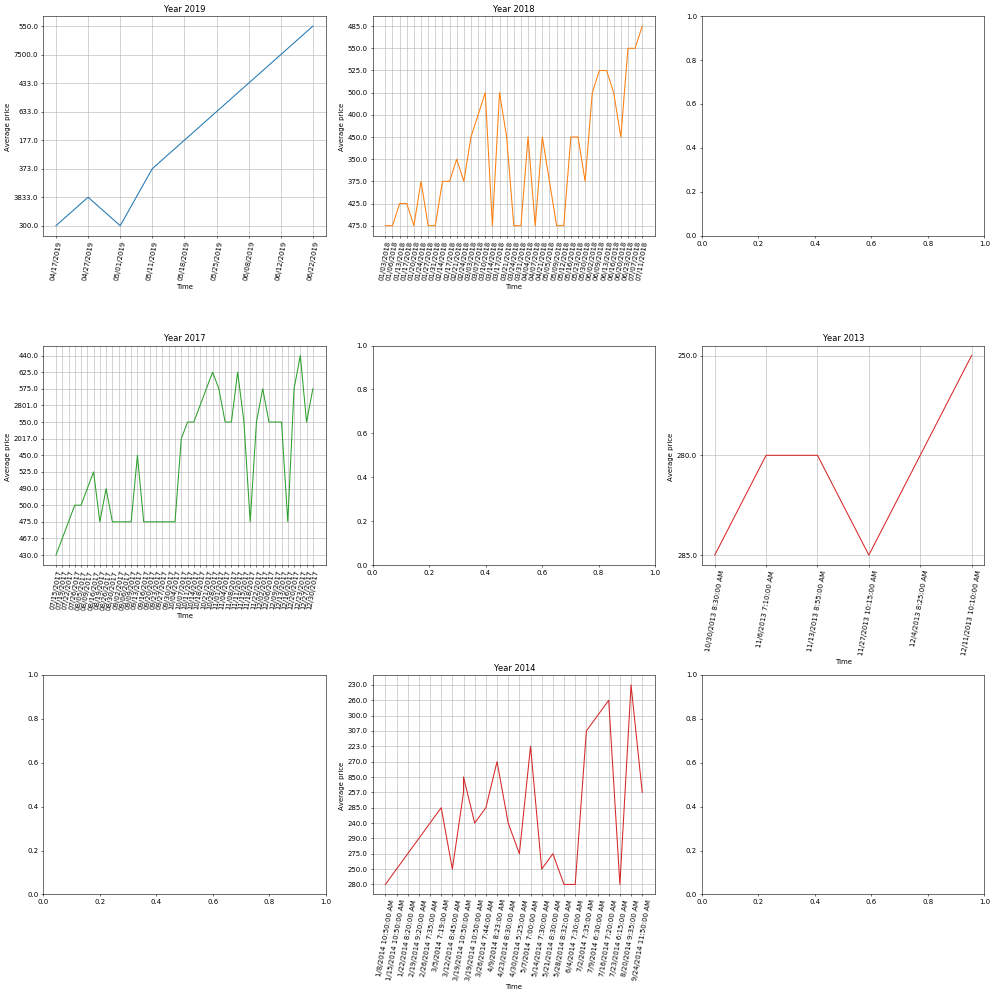

 Time series plot for Amashu in Bushenge market of Nyamasheke districts 


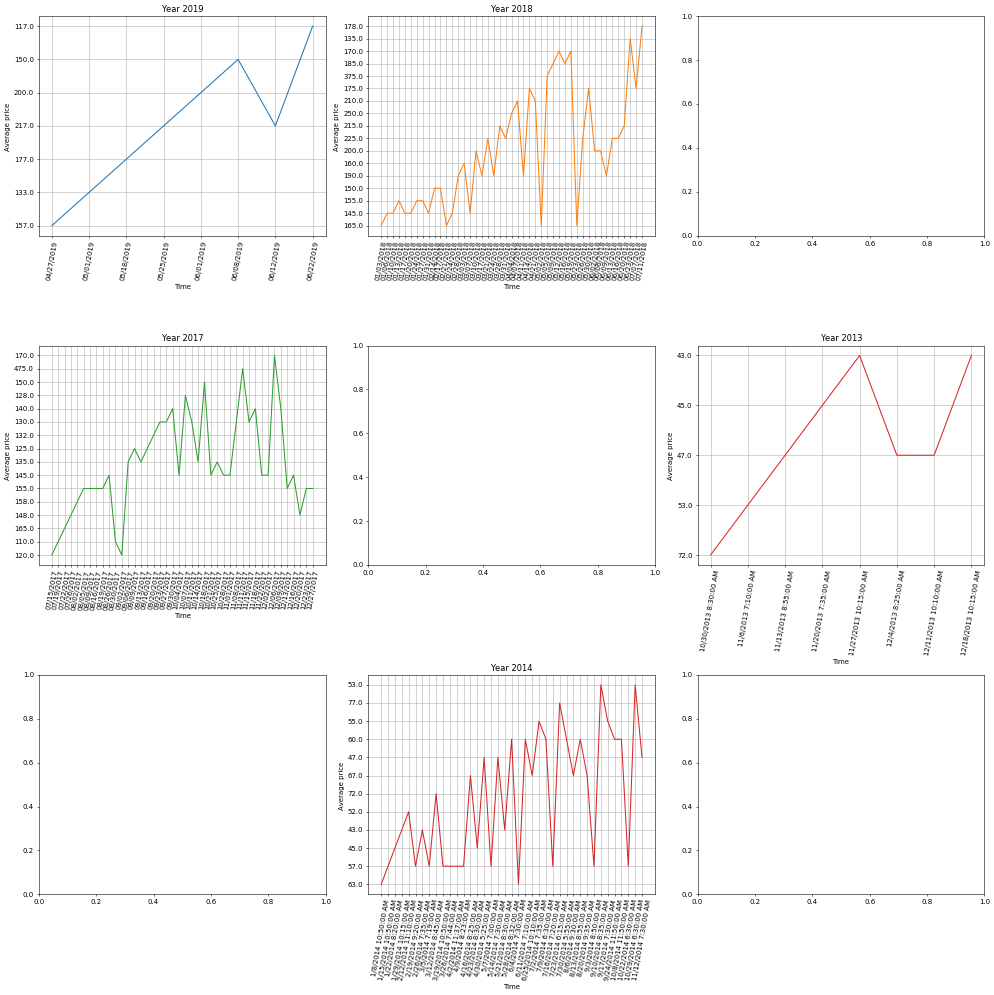

 Time series plot for Ifu-imyumbati in Bushenge market of Nyamasheke districts 


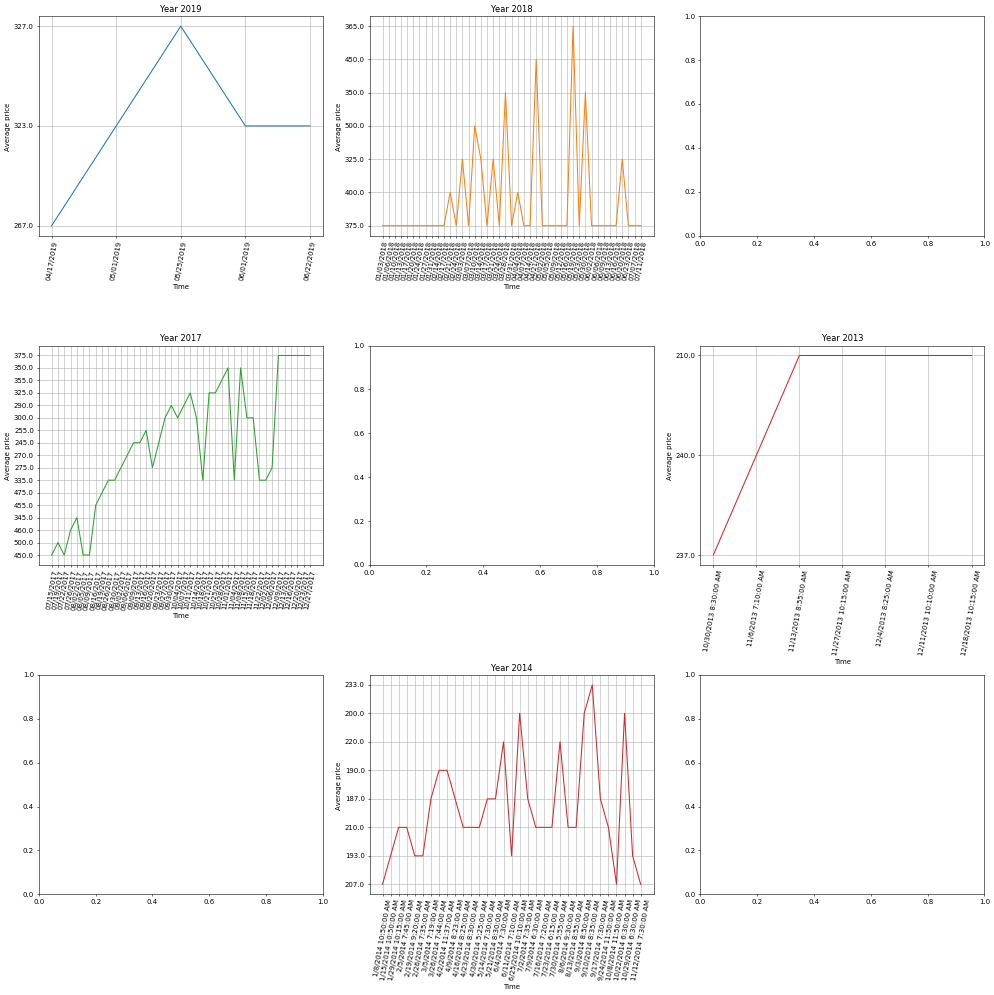

 Time series plot for Ifu-ibigori in Bushenge market of Nyamasheke districts 


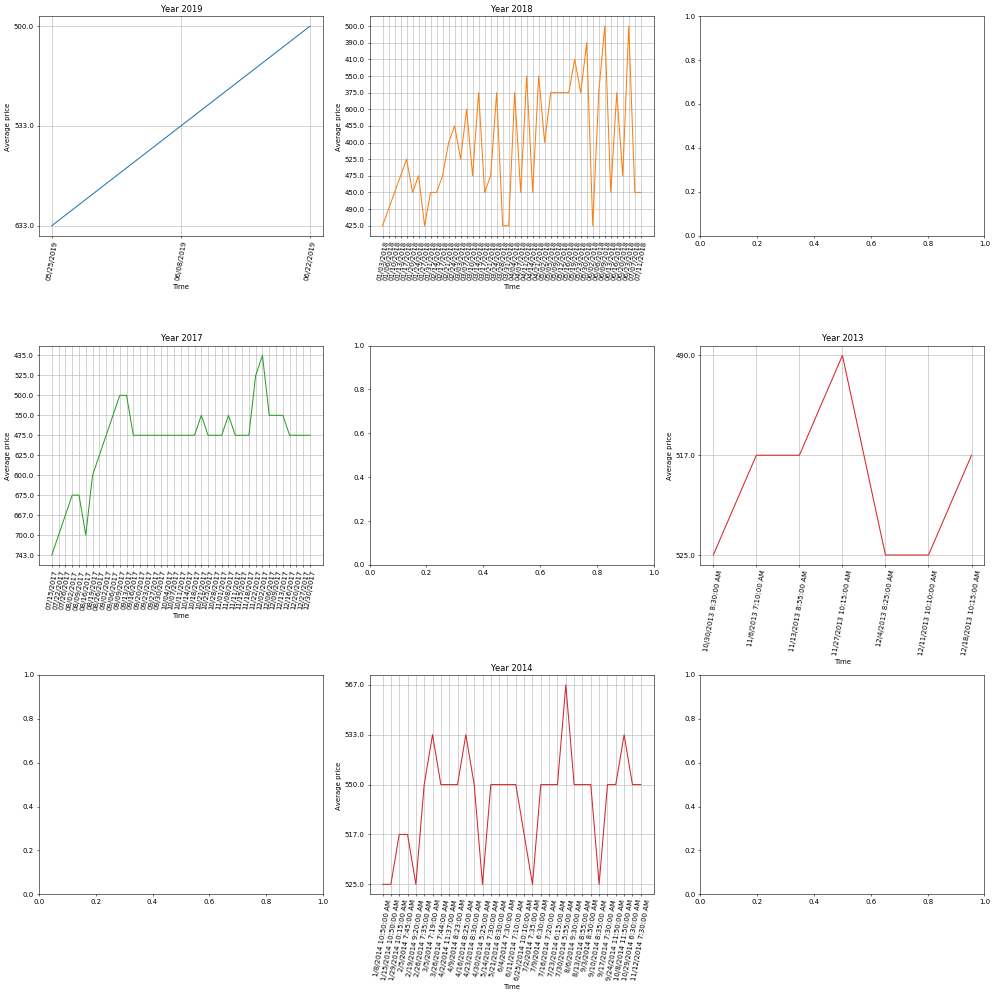

 Time series plot for Umuceli-RW in Bushenge market of Nyamasheke districts 


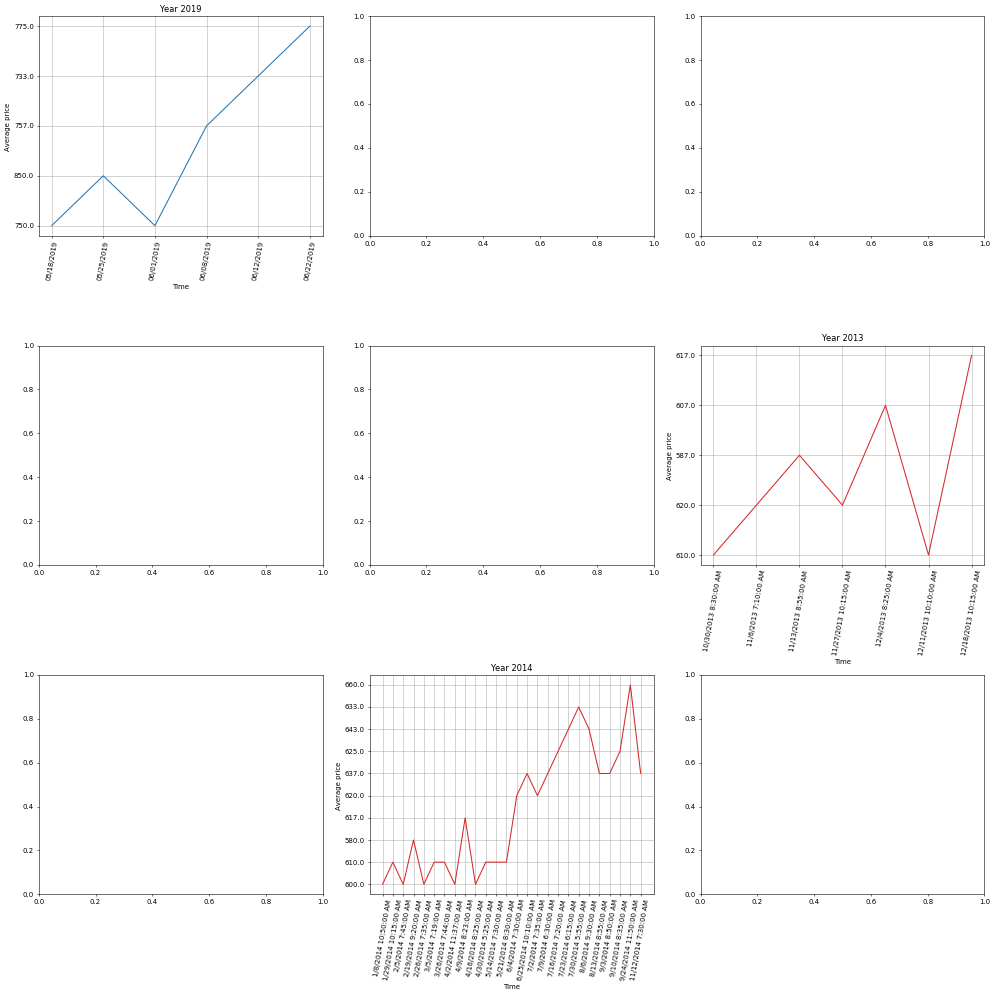

 Time series plot for Ibishyimbo in Bushenge market of Nyamasheke districts 


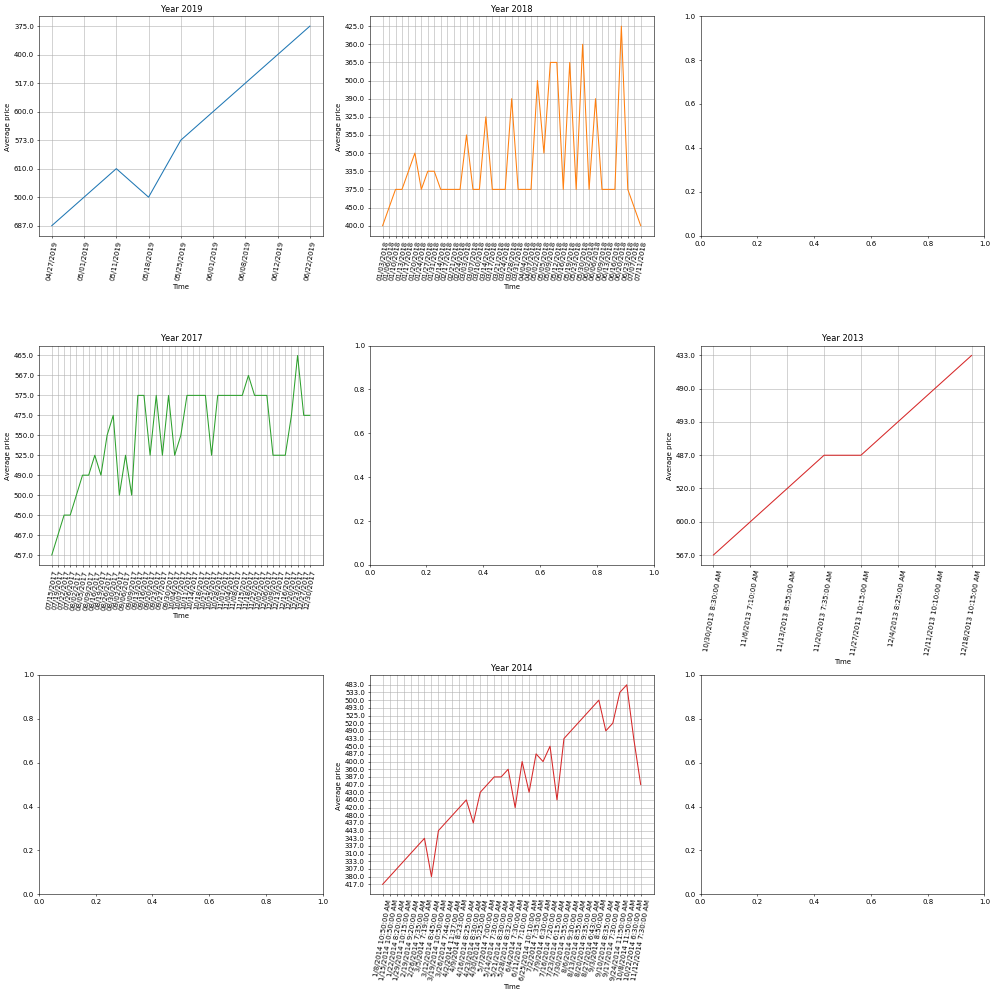

 Time series plot for Ibirayi in Bushenge market of Nyamasheke districts 


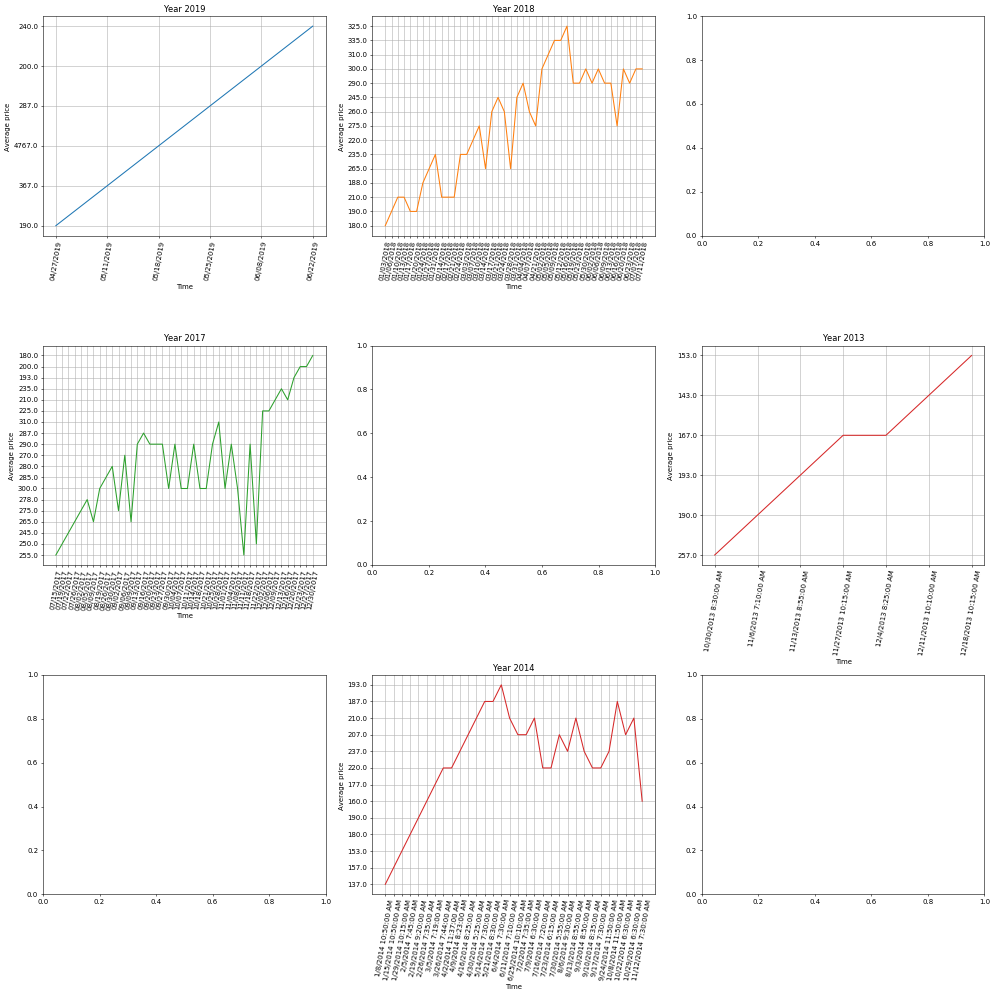

 Time series plot for Ibijumba in Bushenge market of Nyamasheke districts 


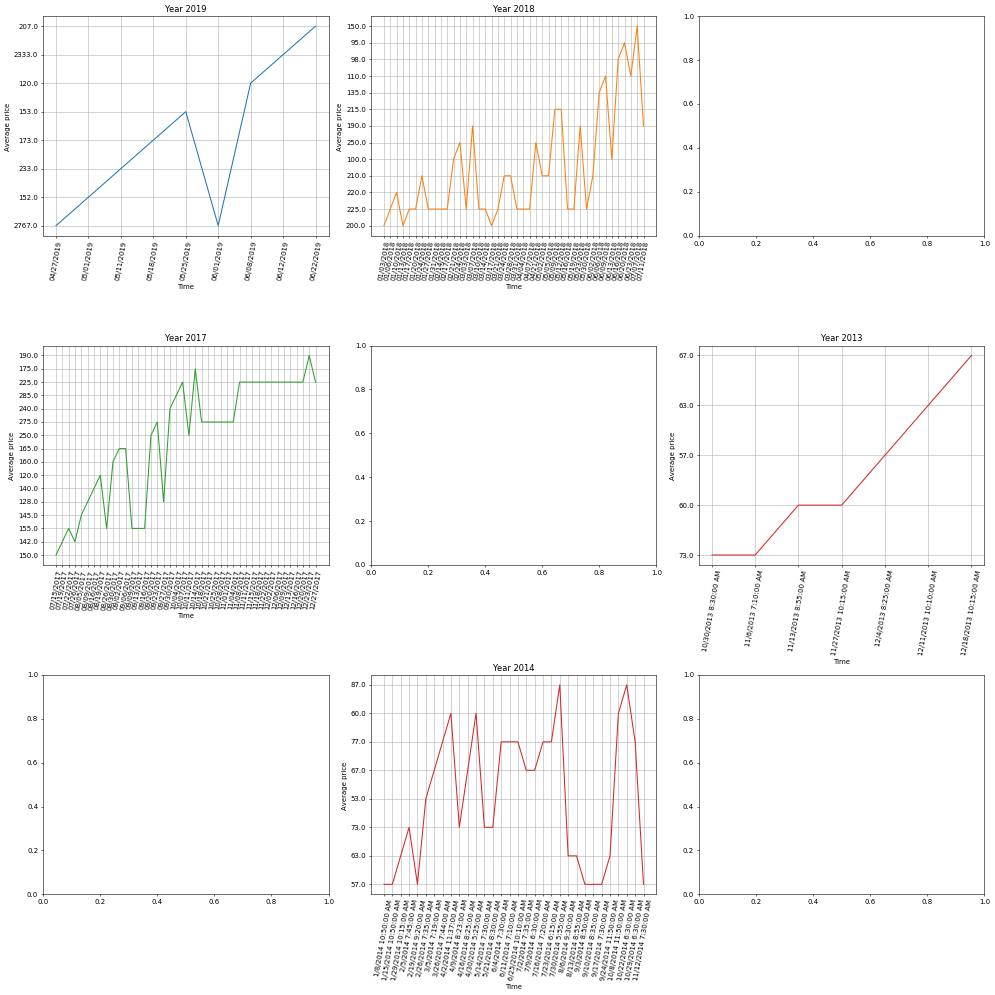

 Time series plot for Inyama-ingurube in Bushenge market of Nyamasheke districts 


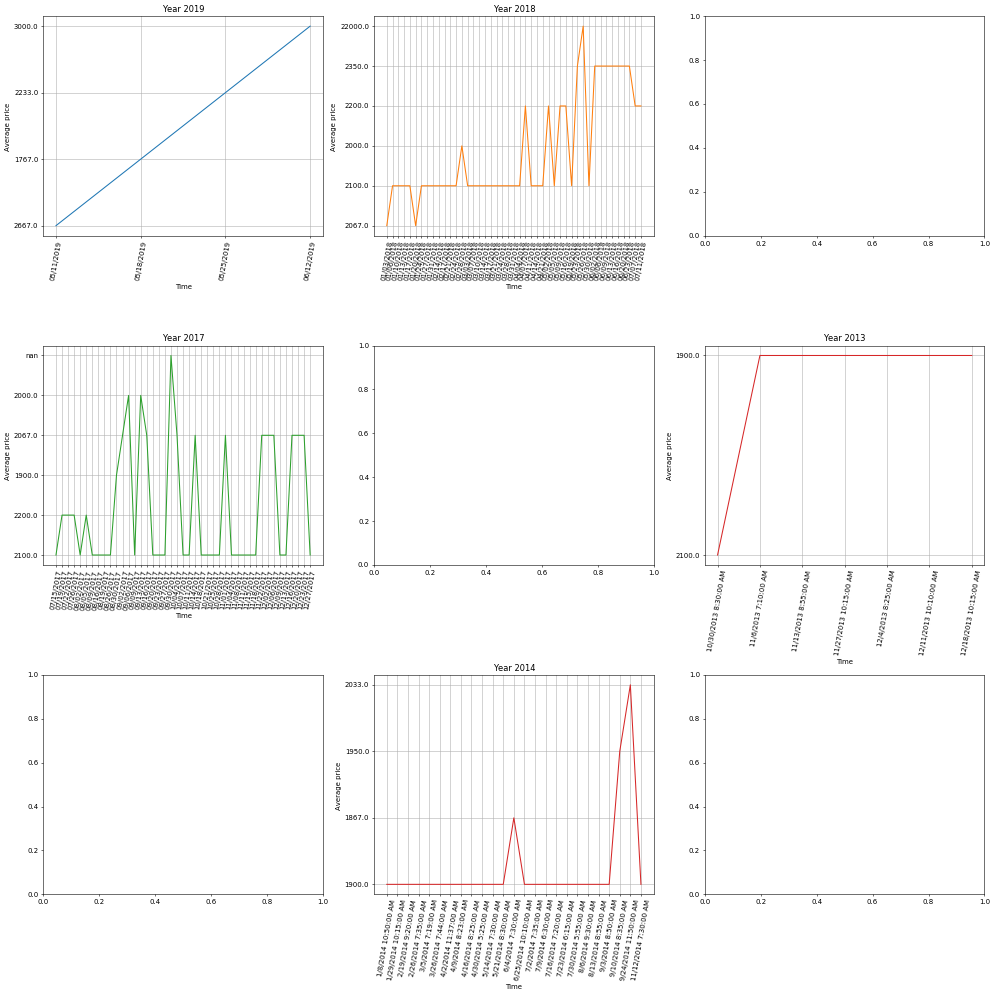

 Time series plot for Inyama-zinka in Bushenge market of Nyamasheke districts 


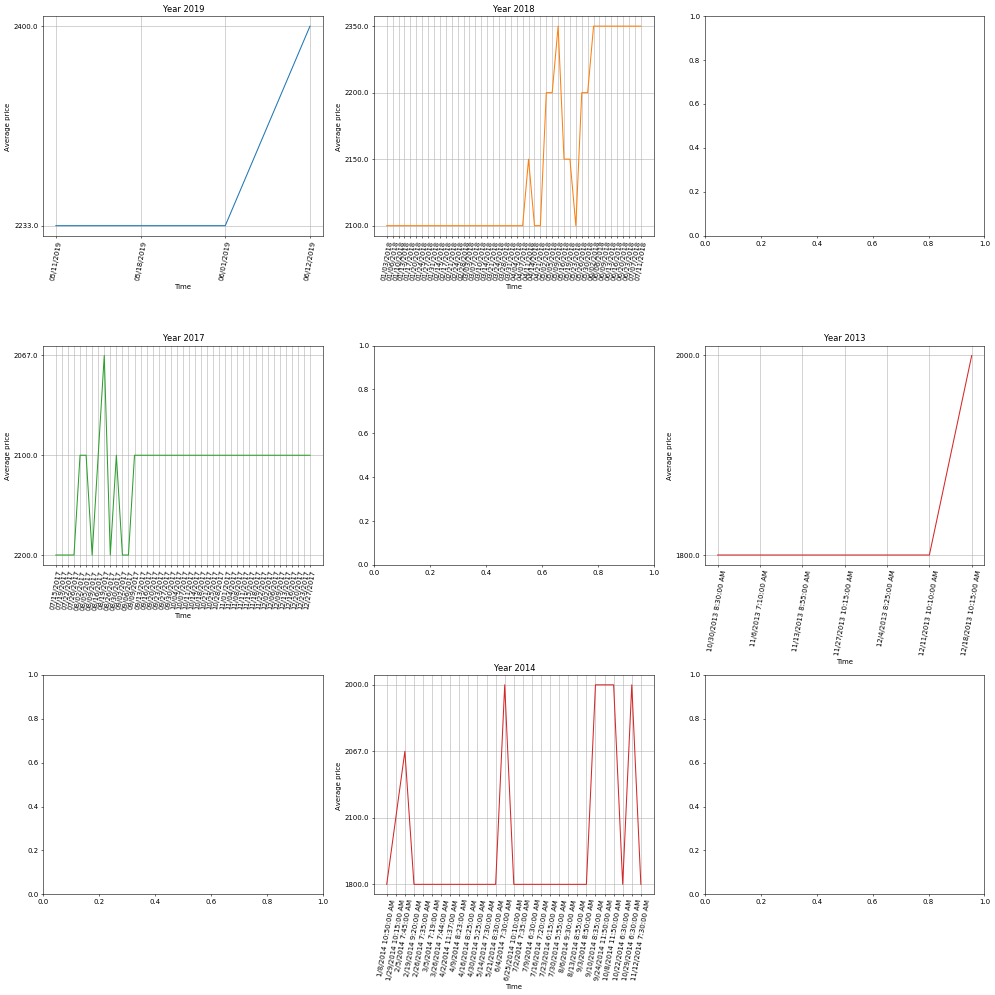

 Time series plot for ibitunguru-bitukura in Bushenge market of Nyamasheke districts 


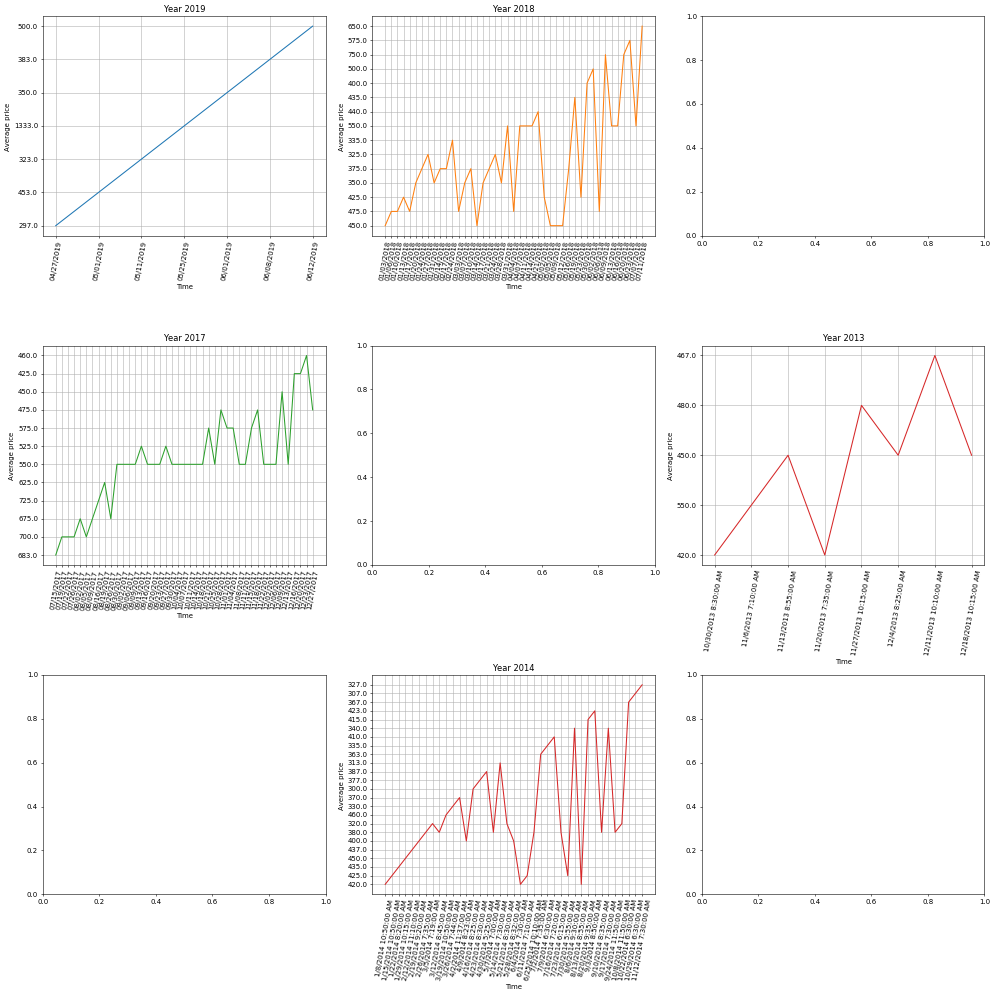

 Time series plot for Inyanya in Bushenge market of Nyamasheke districts 


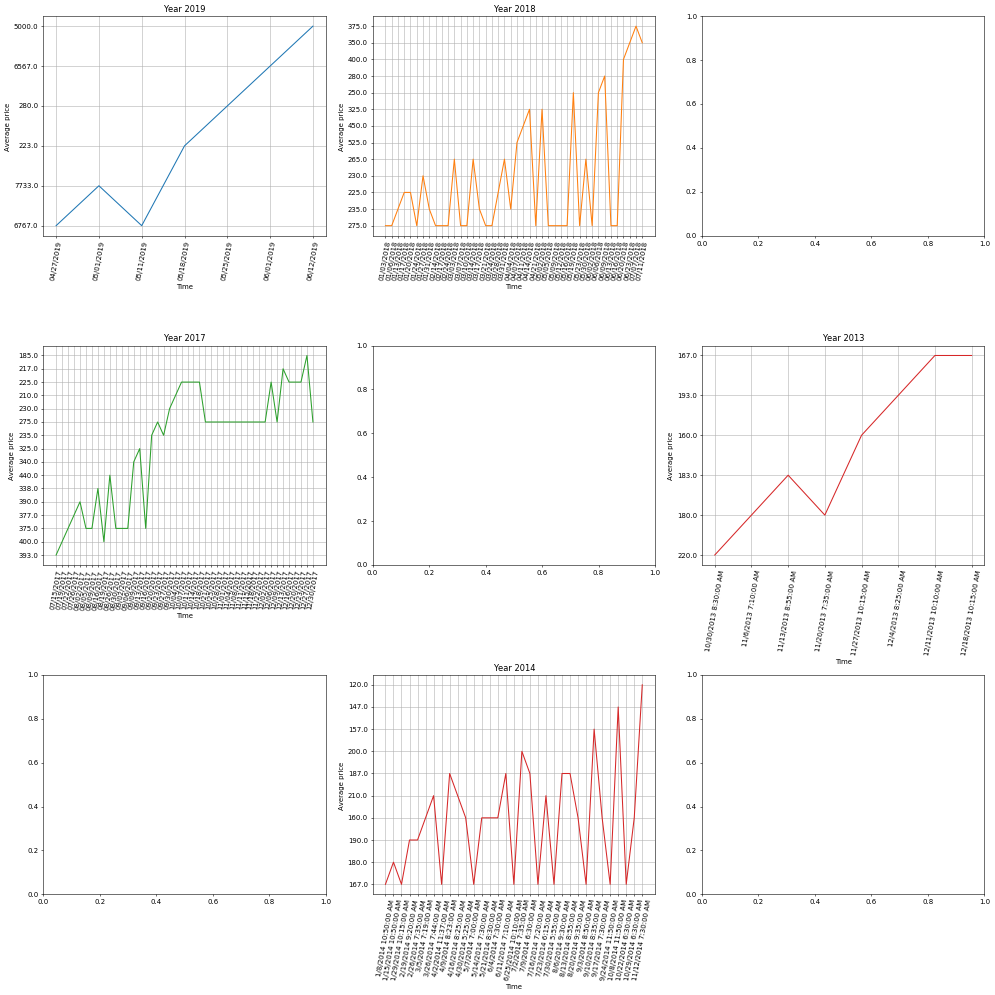

 Time series plot for Imineke in Bushenge market of Nyamasheke districts 


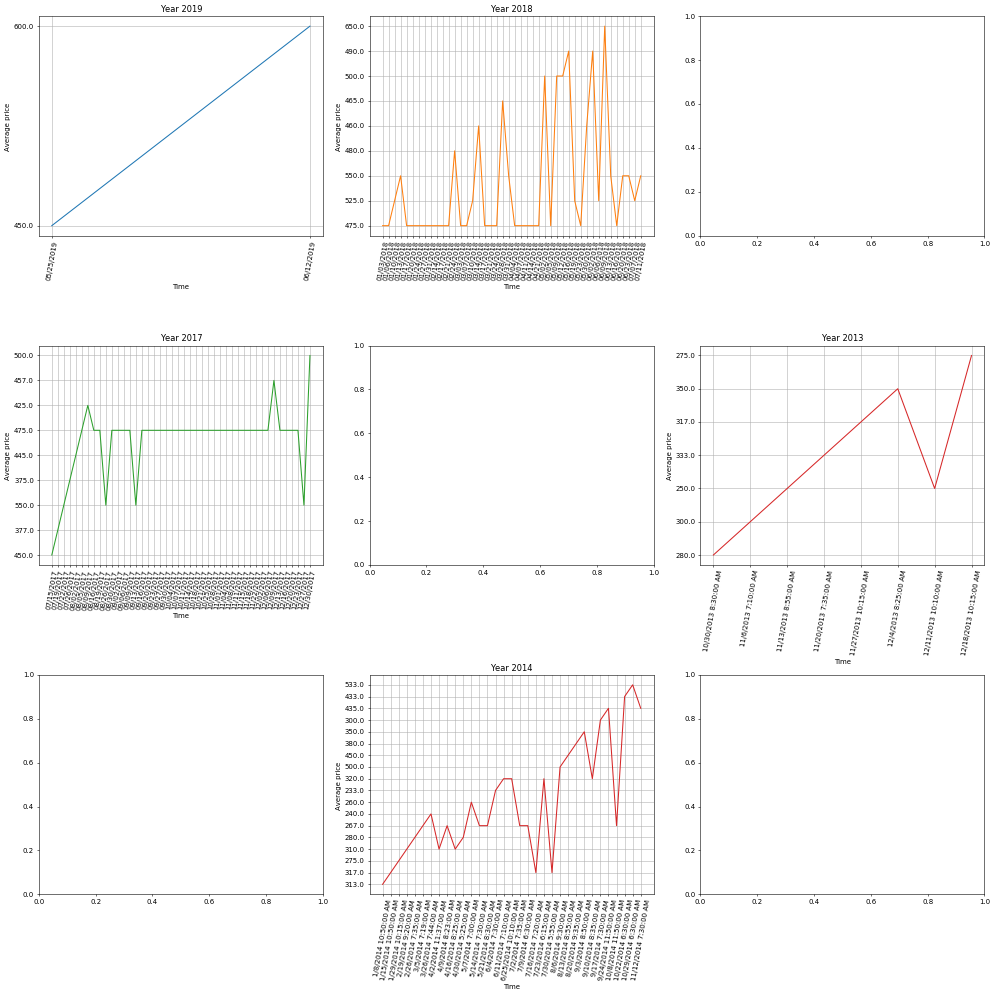

 Time series plot for Inanasi in Bushenge market of Nyamasheke districts 


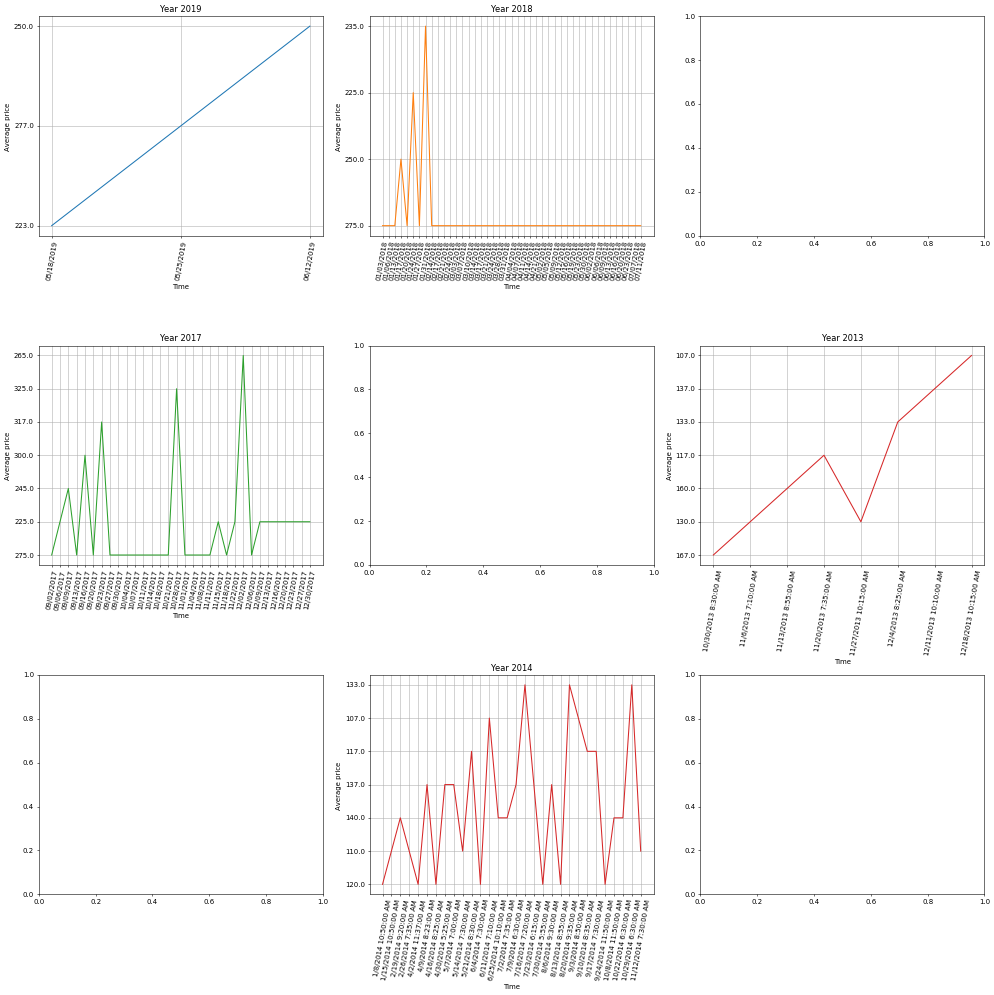

 Time series plot for Amasaka in Bushenge market of Nyamasheke districts 


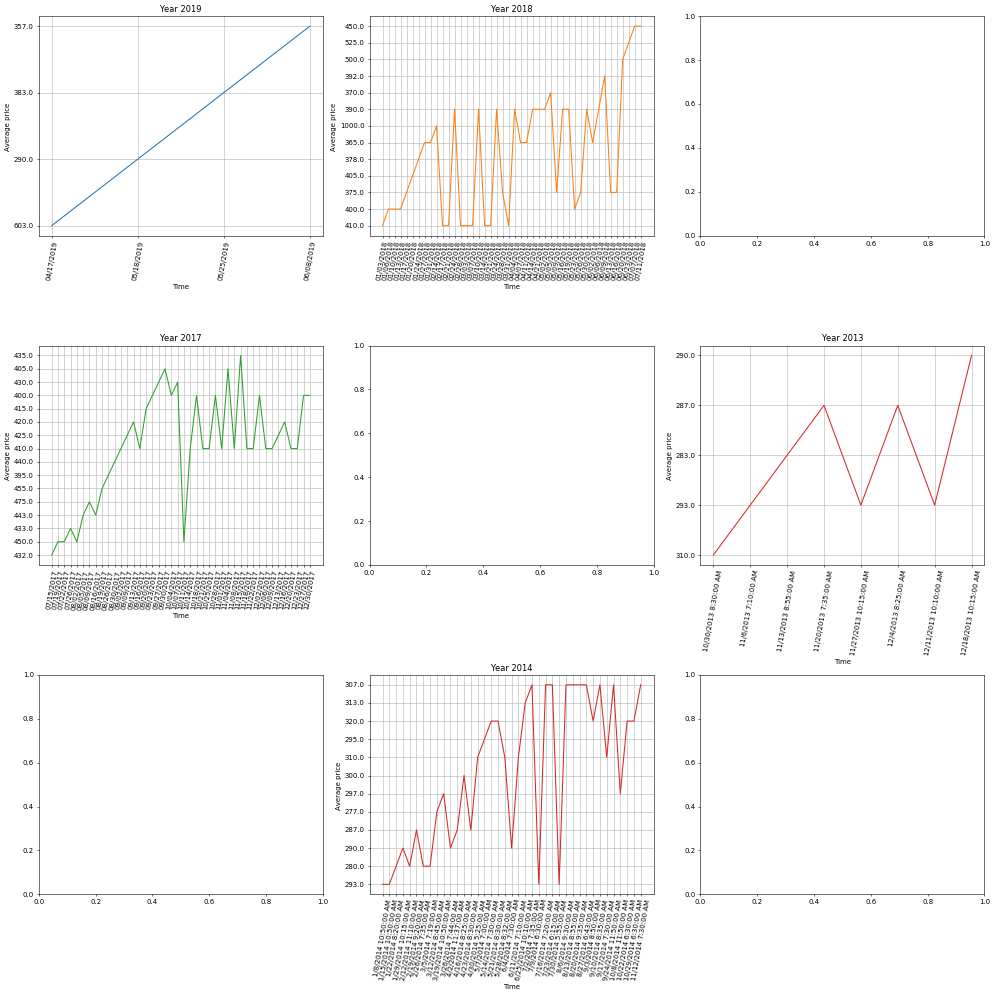

 Time series plot for Inyama-ihene in Bushenge market of Nyamasheke districts 


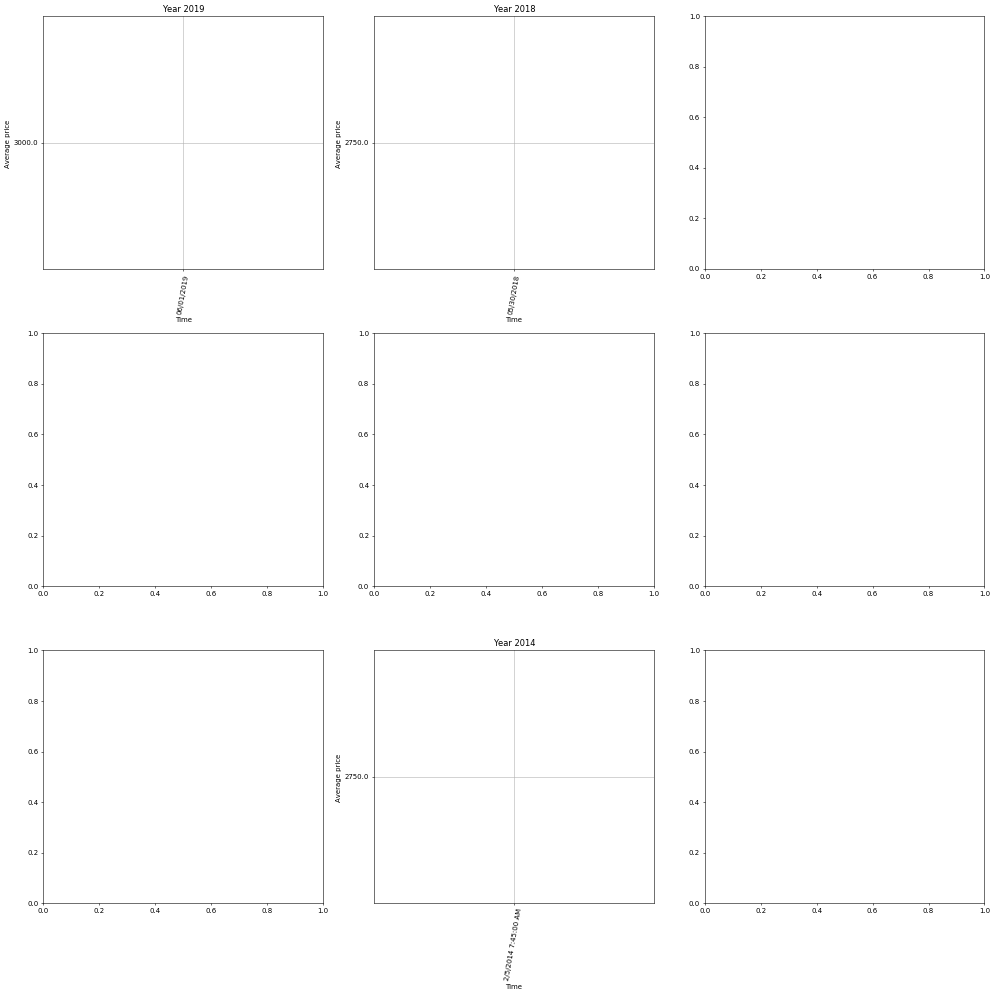

 Time series plot for Imyumbati in Bushenge market of Nyamasheke districts 


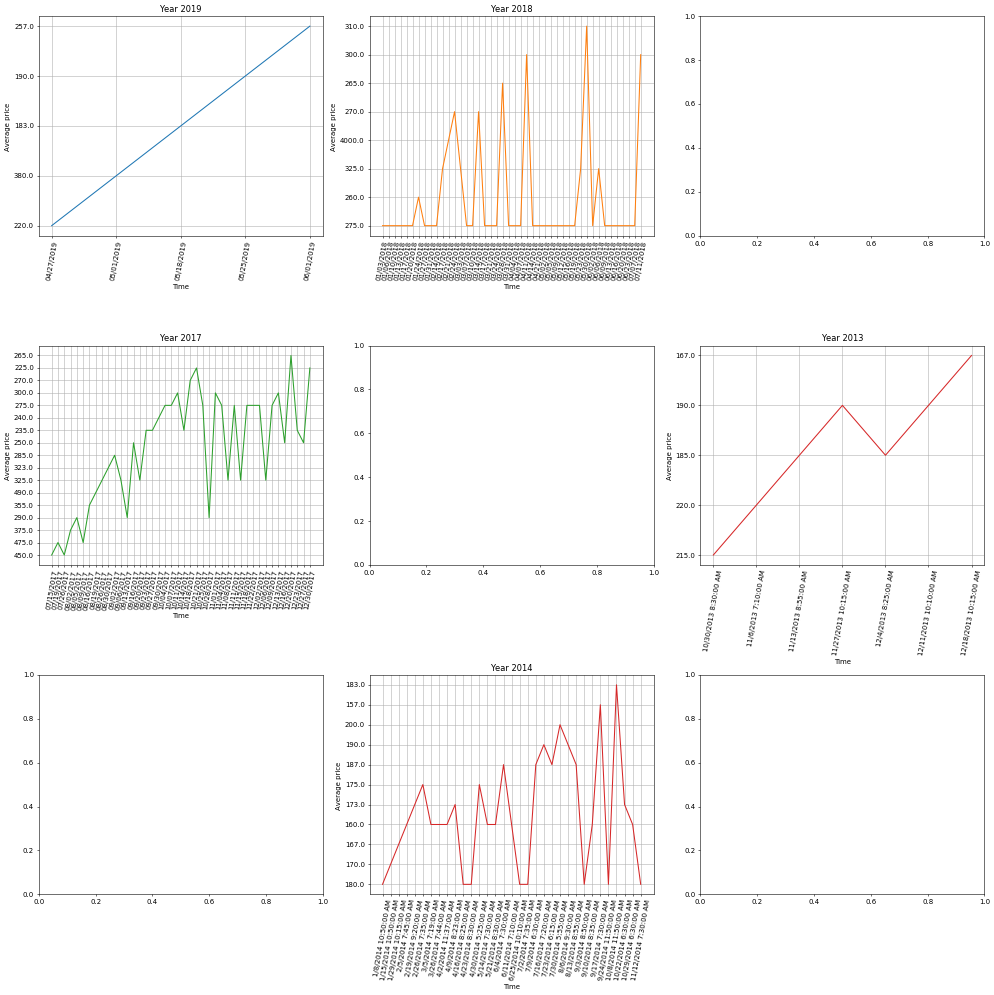

 Time series plot for Ifu-ibigori-yo-mumahanga in Bushenge market of Nyamasheke districts 


TypeError: object of type 'numpy.float64' has no len()

In [100]:
displayTimeSeriesData('Nyamasheke','Bushenge')